# EfficientNetwork-model

## Descarga del dataset 🔽

---



In [12]:
# import kagglehub
import kagglehub
kagglehub.login()


Kaggle credentials set.
Kaggle credentials successfully validated.


In [13]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

danielvaldez202021_proyect_ds_dataset_path = kagglehub.dataset_download("danielvaldez202021/proyect-ds-dataset")


print("Path to dataset files:", danielvaldez202021_proyect_ds_dataset_path)

Path to dataset files: /root/.cache/kagglehub/datasets/danielvaldez202021/proyect-ds-dataset/versions/8


## Importaciones ⬇️

In [14]:
import os
import random
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
from collections import Counter
from tqdm import tqdm
import matplotlib.pyplot as plt

## Mini análisis previo
Después del preprocesamiento llevado a cabo en los datos, el cual incluyó:

1. **Aumentaciones de datos**: Se aplicaron dos conjuntos de aumentaciones con `albumentations` para mejorar la variabilidad y el balance entre clases:
   - **Minority augmentations**: Diseñadas específicamente para la clase minoritaria (LAA), con transformaciones más intensivas como `HorizontalFlip`, `VerticalFlip`, `RandomRotate90`, `ColorJitter` y `CoarseDropout`. Estos aumentos permiten que la clase minoritaria tenga más representaciones variadas en el modelo, duplicando algunos ejemplos para darles mayor peso.
   - **Majority augmentations**: Estas aumentaciones menos intensivas se aplicaron a la clase mayoritaria, manteniendo la variabilidad de la clase sin sobrerrepresentarla. Incluyen cambios como `HorizontalFlip`, `VerticalFlip`, y ajustes menores de color.

2. **Filtrado de parches no informativos**: Se usó dos funciones de verificación (`is_background_patch` y `is_valid_patch`) para asegurar que cada parche contuviera suficiente información. Estas verificaciones incluyen:
   - **Verificación de fondo**: Para eliminar imágenes de parches que carezcan de contenido útil, evaluando su desviación estándar y la diferencia de intensidad de color.
   - **Verificación de validez**: Excluyendo parches con baja variabilidad de píxeles que podrían no aportar detalles importantes para el modelo.

3. **División de datos y creación de fragmentos**: Se dividió el conjunto de datos en `k-folds` estratificados para entrenamiento y validación, manteniendo el balance de clases en cada fold. Cada fold se procesó y guardó en fragmentos de 5,000 muestras, optimizando el uso de memoria. Para el conjunto de prueba, se crearon fragmentos sin etiquetas, siguiendo el mismo proceso para mantener la consistencia.

> 💡Evaluando el resultado. Sin embargo la data se encuentra algo desequilibrada aun. Por lo que se debe optar un enfoque se asignación de pesos a las clases al entrenar el modelo.

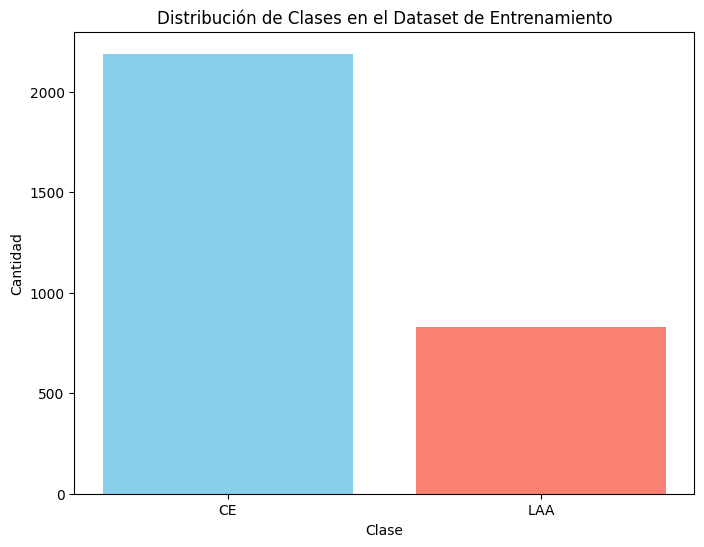

In [ ]:
# Ruta al directorio donde están almacenados los archivos de etiquetas
data_path = danielvaldez202021_proyect_ds_dataset_path

# Función para obtener todos los archivos de etiquetas en los folds
def get_label_files(data_path, fold_num, dataset_type="train"):
    label_files = []
    for file in os.listdir(data_path):
        if f"{dataset_type}_fold{fold_num}" in file and file.startswith("y"):
            label_files.append(os.path.join(data_path, file))
    return label_files

# Recopilar todas las etiquetas
all_labels = []

# Recorrer todos los folds y cargar sólo los archivos de etiquetas
for fold_num in range(5):  # Asumiendo 5 folds
    label_files = get_label_files(data_path, fold_num, dataset_type="train")
    for lbl_file in label_files:
        labels = np.load(lbl_file)
        all_labels.extend(labels)  # Agregar todas las etiquetas de este archivo

# Mapear etiquetas de texto a enteros, si es necesario
label_mapping = {'CE': 0, 'LAA': 1}
mapped_labels = [label_mapping[label] for label in all_labels]

# Contar la cantidad de cada clase
label_counts = Counter(mapped_labels)

# Crear la gráfica de proporción de clases
class_names = ["CE", "LAA"]
class_counts = [label_counts[0], label_counts[1]]  # CE = 0, LAA = 1

plt.figure(figsize=(8, 6))
plt.bar(class_names, class_counts, color=["skyblue", "salmon"])
plt.xlabel("Clase")
plt.ylabel("Cantidad")
plt.title("Distribución de Clases en el Dataset de Entrenamiento")
plt.show()


> 📝Cada imagen del dataset original se dividió en 15 parches, seleccionados para contener la mayor cantidad de información posible. Este enfoque facilita el trabajo del modelo, ya que los modelos tienden a ser más lentos y tienen dificultades para abstraer características cuando se entrenan con imágenes grandes. Dividir las imágenes en parches permite mejorar la eficiencia y precisión en la extracción de características importantes.

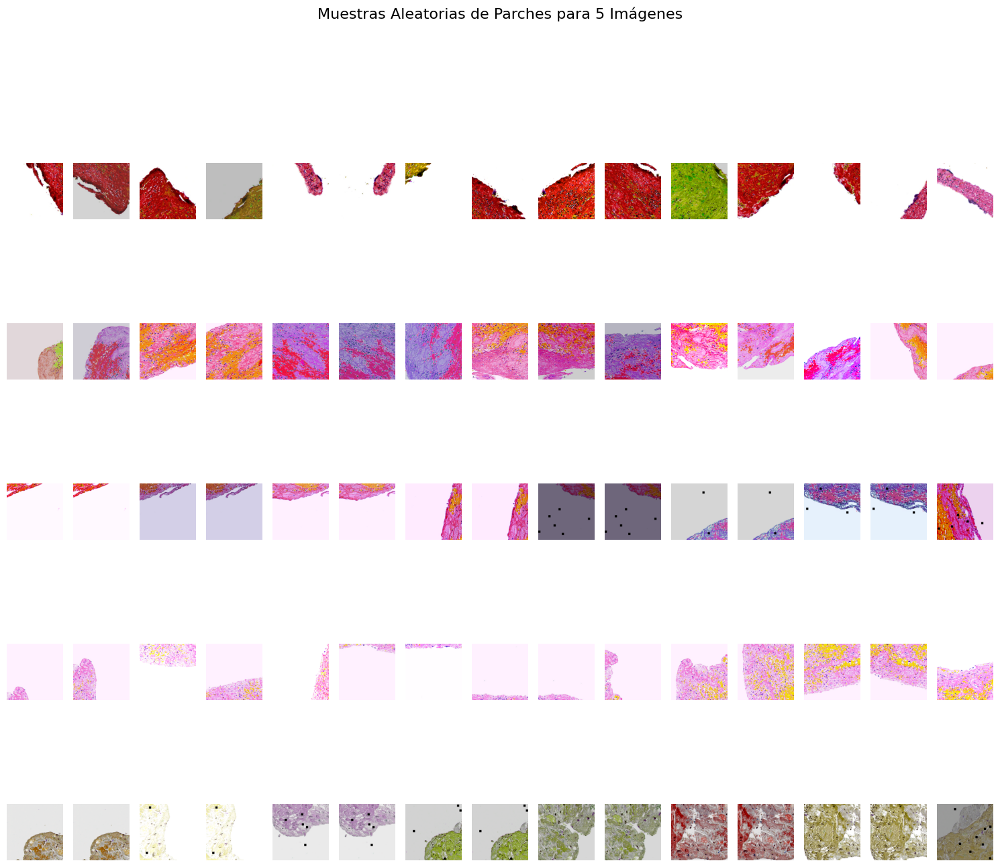

In [ ]:

# Carga un fragmento de ejemplo (asumiendo que cada uno contiene múltiples imágenes con sus parches)
# Actualiza la ruta para apuntar a uno de tus archivos `X_train` o `X_val`
chunk_path = os.path.join(data_path, "X_val_fold1_chunk_0.npy")
data = np.load(chunk_path)

# Selecciona aleatoriamente 5 imágenes para inspeccionar
num_images = 5
fig, axes = plt.subplots(num_images, 15, figsize=(15, num_images * 3))

for img_index in range(num_images):
    # Escoger aleatoriamente la imagen
    patches = data[np.random.randint(0, data.shape[0])]
    for patch_index in range(15):  # Muestra 5 parches por imagen
        axes[img_index, patch_index].imshow(patches[patch_index].transpose(1, 2, 0))  # Transpone si está en formato canales-primero
        axes[img_index, patch_index].axis('off')

plt.suptitle("Muestras Aleatorias de Parches para 5 Imágenes", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# Entrenamiento del modelo
### Configuración del dispositivo
```python
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Usando el dispositivo: {device}')
```
> 💡 Se configura el dispositivo para ejecutar el modelo en GPU si está disponible, o en CPU si no lo está. Esto acelera el entrenamiento, especialmente en tareas con procesamiento de imágenes.

### Definición de la clase `CustomImageDataset`
```python
class CustomImageDataset(Dataset):
    def __init__(self, data_dir, dataset_type):
        self.data_dir = data_dir
        self.dataset_type = dataset_type
        self.image_files = []
        self.labels = []
```
Esta clase crea un objeto dataset que carga y organiza los datos desde archivos `.npy`. Dependiendo del tipo de dataset (`train` o `val`), carga imágenes y etiquetas específicas.

1. **Carga de archivos `.npy`**:
    ```python
    for file_name in os.listdir(data_dir):
        if file_name.startswith(f'X_{dataset_type}_chunk_') and file_name.endswith('.npy'):
            ...
    ```
    La clase busca y carga fragmentos `.npy` de imágenes y etiquetas correspondientes a la partición de datos especificada (`train` o `val`).

2. **Aplanado de listas de imágenes y etiquetas**:
    ```python
    self.images = []
    self.targets = []
    ...
    self.targets = np.repeat(y_chunk, num_patches)
    ```
    > 📝 Cada fragmento de imágenes es aplanado para que el modelo pueda procesarlas como parches individuales. Esto también implica duplicar las etiquetas para cada parche, asegurando que cada parche individual tenga su respectiva etiqueta.

3. **Codificación de etiquetas**:
    ```python
    self.le = LabelEncoder()
    self.targets = self.le.fit_transform(self.targets)
    ```
    Se utiliza `LabelEncoder` para transformar las etiquetas en formato numérico.

4. **Métodos `__len__` y `__getitem__`**:
    Estos métodos son obligatorios para definir un dataset en PyTorch. `__getitem__` convierte las imágenes en tensores y normaliza los valores de píxel.

### Creación del `DataLoader` con muestreo ponderado
```python
def create_data_loader(dataset, batch_size):
    ...
```
Este `DataLoader` se configura para muestrear con peso, utilizando `WeightedRandomSampler`, lo cual es esencial para balancear clases desiguales en el dataset.

> 💡 **Muestreo ponderado**: Si las clases están desbalanceadas, el modelo puede sesgarse hacia la clase mayoritaria. Con un `WeightedRandomSampler`, se ajusta la probabilidad de selección para las clases minoritarias, promoviendo un entrenamiento más balanceado.

### Definición del modelo `EfficientNetClassifier`
```python
class EfficientNetClassifier(nn.Module):
    def __init__(self, num_classes):
        ...
```
Este modelo usa `EfficientNet_B0`, un modelo preentrenado, con la última capa reemplazada para clasificar en el número de clases de nuestro problema.

> 💡 **Modelos preentrenados**: Usar una red preentrenada permite aprovechar características ya aprendidas en imágenes generales, lo que suele mejorar la precisión y reducir el tiempo de entrenamiento.

### Preparación del dataset y `DataLoader`
```python
train_dataset = CustomImageDataset(data_dir, 'train_fold0')
val_dataset = CustomImageDataset(data_dir, 'val_fold0')
train_loader = create_data_loader(train_dataset, batch_size)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
```
Crea datasets y `DataLoader` para entrenamiento y validación. Usando diferentes `folds`, se pueden evaluar distintas divisiones de datos para una validación cruzada robusta.

### Configuración de pérdida y optimizador
```python
class_counts = np.bincount(train_dataset.targets)
class_weights = 1. / class_counts
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
```
- `CrossEntropyLoss` se configura con pesos de clase para penalizar las clases minoritarias.
- `Adam` se usa como optimizador, ideal para redes profundas y adecuado para imágenes complejas.

### Funciones de entrenamiento y evaluación
1. **Función de entrenamiento**:
    ```python
    def train(model, loader, criterion, optimizer):
        ...
    ```
    En cada batch, se calculan las pérdidas, se retropropagan los gradientes, y se actualizan los parámetros del modelo. La pérdida acumulada se divide por el tamaño del dataset para obtener la pérdida promedio.

2. **Función de evaluación**:
    ```python
    def evaluate(model, loader, criterion):
        ...
    ```
    Durante la evaluación, el modelo no calcula gradientes (ahorrando memoria y tiempo). La pérdida de validación y las predicciones se calculan para cada batch.

> 📝 **Evaluación sin gradientes**: `torch.no_grad()` es una práctica común en la validación para evitar el cálculo y almacenamiento de gradientes, lo cual reduce el uso de memoria y hace el proceso más rápido.

### Ciclo de entrenamiento completo
```python
for epoch in range(num_epochs):
    ...
```
En cada época:
1. Entrena el modelo y evalúa la pérdida de entrenamiento y validación.
2. Muestra las métricas de clasificación y la matriz de confusión.
3. Guarda el modelo si mejora la pérdida de validación.

> 💡 **Guardado de mejores modelos**: Guardar solo los modelos con la mejor pérdida de validación es crucial para evitar el sobreajuste.

### Visualización de pérdidas de entrenamiento y validación
```python
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), train_losses, label='Pérdida de entrenamiento')
plt.plot(range(1, num_epochs + 1), val_losses, label='Pérdida de validación')
...
plt.show()
```
Al finalizar el entrenamiento, se grafica la pérdida de entrenamiento y validación para evaluar la convergencia del modelo y observar si existen patrones de sobreajuste o subajuste.

Usando el dispositivo: cuda
Epoch 1/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.69it/s]


Pérdida de entrenamiento: 0.3132
Pérdida de validación: 0.3553
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.92      0.84      0.88      1650
         LAA       0.66      0.81      0.73       615

    accuracy                           0.83      2265
   macro avg       0.79      0.83      0.80      2265
weighted avg       0.85      0.83      0.84      2265

Matriz de confusión:
[[1389  261]
 [ 115  500]]
Modelo mejorado y guardado.
Epoch 2/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.86it/s]


Pérdida de entrenamiento: 0.1590
Pérdida de validación: 0.3996
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.90      0.93      0.91      1650
         LAA       0.78      0.71      0.75       615

    accuracy                           0.87      2265
   macro avg       0.84      0.82      0.83      2265
weighted avg       0.87      0.87      0.87      2265

Matriz de confusión:
[[1529  121]
 [ 178  437]]
Epoch 3/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.72it/s]


Pérdida de entrenamiento: 0.0868
Pérdida de validación: 0.4616
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.89      0.96      0.92      1650
         LAA       0.87      0.68      0.76       615

    accuracy                           0.88      2265
   macro avg       0.88      0.82      0.84      2265
weighted avg       0.88      0.88      0.88      2265

Matriz de confusión:
[[1588   62]
 [ 199  416]]
Epoch 4/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.80it/s]


Pérdida de entrenamiento: 0.0597
Pérdida de validación: 0.4612
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.90      0.95      0.93      1650
         LAA       0.85      0.73      0.78       615

    accuracy                           0.89      2265
   macro avg       0.88      0.84      0.85      2265
weighted avg       0.89      0.89      0.89      2265

Matriz de confusión:
[[1569   81]
 [ 167  448]]
Epoch 5/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.80it/s]


Pérdida de entrenamiento: 0.0426
Pérdida de validación: 0.6289
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.89      0.97      0.93      1650
         LAA       0.88      0.67      0.76       615

    accuracy                           0.89      2265
   macro avg       0.89      0.82      0.84      2265
weighted avg       0.89      0.89      0.88      2265

Matriz de confusión:
[[1596   54]
 [ 203  412]]
Epoch 6/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.78it/s]


Pérdida de entrenamiento: 0.0316
Pérdida de validación: 0.6612
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.89      0.95      0.92      1650
         LAA       0.84      0.69      0.76       615

    accuracy                           0.88      2265
   macro avg       0.87      0.82      0.84      2265
weighted avg       0.88      0.88      0.88      2265

Matriz de confusión:
[[1570   80]
 [ 193  422]]
Epoch 7/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.72it/s]


Pérdida de entrenamiento: 0.0293
Pérdida de validación: 0.5553
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.90      0.95      0.93      1650
         LAA       0.84      0.73      0.78       615

    accuracy                           0.89      2265
   macro avg       0.87      0.84      0.85      2265
weighted avg       0.89      0.89      0.89      2265

Matriz de confusión:
[[1567   83]
 [ 169  446]]
Epoch 8/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.84it/s]


Pérdida de entrenamiento: 0.0273
Pérdida de validación: 0.6694
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.90      0.96      0.93      1650
         LAA       0.87      0.71      0.78       615

    accuracy                           0.89      2265
   macro avg       0.89      0.84      0.86      2265
weighted avg       0.89      0.89      0.89      2265

Matriz de confusión:
[[1587   63]
 [ 178  437]]
Epoch 9/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.80it/s]


Pérdida de entrenamiento: 0.0248
Pérdida de validación: 0.6187
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.90      0.96      0.93      1650
         LAA       0.86      0.73      0.79       615

    accuracy                           0.89      2265
   macro avg       0.88      0.84      0.86      2265
weighted avg       0.89      0.89      0.89      2265

Matriz de confusión:
[[1577   73]
 [ 168  447]]
Epoch 10/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.95it/s]


Pérdida de entrenamiento: 0.0180
Pérdida de validación: 0.7357
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.89      0.97      0.93      1650
         LAA       0.90      0.69      0.78       615

    accuracy                           0.89      2265
   macro avg       0.89      0.83      0.85      2265
weighted avg       0.89      0.89      0.89      2265

Matriz de confusión:
[[1601   49]
 [ 193  422]]
Entrenamiento completado.


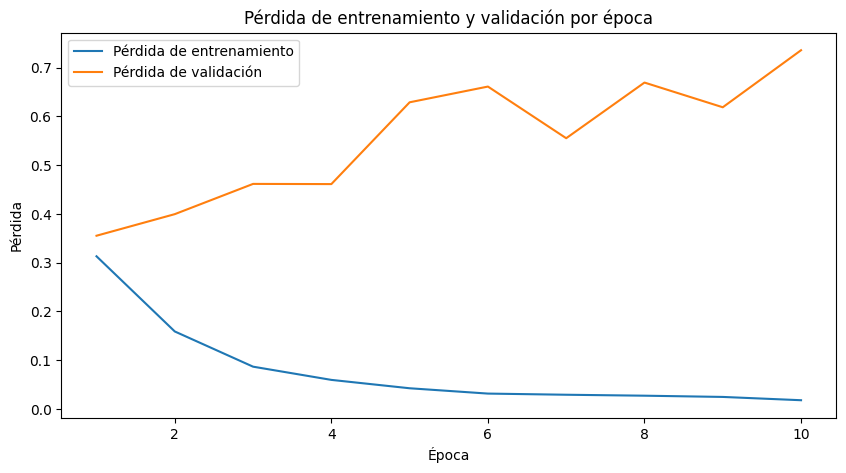

In [ ]:
# Definir el dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Usando el dispositivo: {device}')

# Definir la clase Dataset personalizada
class CustomImageDataset(Dataset):
    def __init__(self, data_dir, dataset_type):
        self.data_dir = data_dir
        self.dataset_type = dataset_type
        self.image_files = []
        self.labels = []

        # Cargar todos los archivos .npy
        for file_name in os.listdir(data_dir):
            if file_name.startswith(f'X_{dataset_type}_chunk_') and file_name.endswith('.npy'):
                chunk_index = file_name.split('_')[-1].split('.')[0]
                X_path = os.path.join(data_dir, file_name)
                y_path = os.path.join(data_dir, f'y_{dataset_type}_chunk_{chunk_index}.npy')
                if os.path.exists(y_path):
                    self.image_files.append(X_path)
                    self.labels.append(y_path)

        # Aplanar las listas de imágenes y etiquetas
        self.images = []
        self.targets = []
        for X_file, y_file in zip(self.image_files, self.labels):
            X_chunk = np.load(X_file)  # Forma: (num_imágenes, num_patches, C, H, W)
            y_chunk = np.load(y_file)  # Forma: (num_imágenes,)

            num_images, num_patches, C, H, W = X_chunk.shape
            # Aplanar los parches
            X_chunk = X_chunk.reshape(-1, C, H, W)  # Nueva forma: (num_imágenes * num_patches, C, H, W)
            # Repetir las etiquetas para cada parche
            y_chunk = np.repeat(y_chunk, num_patches)

            self.images.extend(X_chunk)
            self.targets.extend(y_chunk)

        # Codificar las etiquetas
        self.le = LabelEncoder()
        self.targets = self.le.fit_transform(self.targets)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        image = self.images[idx]
        # Normalizar las imágenes
        image = image.astype(np.float32) / 255.0
        # Convertir a tensor
        image = torch.tensor(image)
        label = self.targets[idx]
        return image, label

# Función para crear el DataLoader con WeightedRandomSampler
def create_data_loader(dataset, batch_size):
    # Calcular las muestras por clase
    class_sample_count = np.array([len(np.where(dataset.targets == t)[0]) for t in np.unique(dataset.targets)])
    weight = 1. / class_sample_count
    samples_weight = np.array([weight[t] for t in dataset.targets])

    samples_weight = torch.from_numpy(samples_weight)
    sampler = WeightedRandomSampler(samples_weight.type('torch.DoubleTensor'), len(samples_weight))

    data_loader = DataLoader(dataset, batch_size=batch_size, sampler=sampler, num_workers=4)
    return data_loader

# Definir el modelo
class EfficientNetClassifier(nn.Module):
    def __init__(self, num_classes):
        super(EfficientNetClassifier, self).__init__()
        # Cargar modelo pre-entrenado con los pesos recomendados
        self.model = efficientnet_b0(weights=EfficientNet_B0_Weights.DEFAULT)
        # Reemplazar la capa final
        self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, num_classes)

    def forward(self, x):
        return self.model(x)

# Ruta a los datos
data_dir = danielvaldez202021_proyect_ds_dataset_path  # Reemplaza con la ruta real a tus datos

# Parámetros
batch_size = 32
num_epochs = 10
learning_rate = 1e-4

# Crear datasets y dataloaders
train_dataset = CustomImageDataset(data_dir, 'train_fold0')  # Puedes cambiar el fold si es necesario
val_dataset = CustomImageDataset(data_dir, 'val_fold0')

train_loader = create_data_loader(train_dataset, batch_size)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# Inicializar el modelo, pérdida y optimizador
num_classes = len(np.unique(train_dataset.targets))
model = EfficientNetClassifier(num_classes)
model = model.to(device)

# Utilizar CrossEntropyLoss con pesos de clase
class_counts = np.bincount(train_dataset.targets)
class_weights = 1. / class_counts
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Función de entrenamiento
def train(model, loader, criterion, optimizer):
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(loader, desc='Entrenando'):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

# Función de validación
def evaluate(model, loader, criterion):
    model.eval()
    running_loss = 0.0
    preds = []
    true_labels = []
    with torch.no_grad():
        for images, labels in tqdm(loader, desc='Validando'):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            _, predicted = torch.max(outputs, 1)
            preds.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss, preds, true_labels

# Ciclo de entrenamiento
train_losses = []
val_losses = []
best_val_loss = float('inf')
for epoch in range(num_epochs):
    print(f'Epoch {epoch+1}/{num_epochs}')
    train_loss = train(model, train_loader, criterion, optimizer)
    val_loss, val_preds, val_true = evaluate(model, val_loader, criterion)

    # Almacenar pérdidas
    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f'Pérdida de entrenamiento: {train_loss:.4f}')
    print(f'Pérdida de validación: {val_loss:.4f}')

    # Mostrar métricas
    print('Reporte de clasificación:')
    print(classification_report(val_true, val_preds, target_names=train_dataset.le.classes_))
    print('Matriz de confusión:')
    print(confusion_matrix(val_true, val_preds))

    # Guardar el modelo si mejora
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), 'best_model.pth')
        print('Modelo mejorado y guardado.')

print('Entrenamiento completado.')

# Graficar las pérdidas
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), train_losses, label='Pérdida de entrenamiento')
plt.plot(range(1, num_epochs + 1), val_losses, label='Pérdida de validación')
plt.xlabel('Época')
plt.ylabel('Pérdida')
plt.title('Pérdida de entrenamiento y validación por época')
plt.legend()
plt.show()


En general, el entrenamiento muestra una clara tendencia de reducción de la pérdida de entrenamiento a lo largo de las épocas, lo que indica que el modelo está aprendiendo efectivamente los patrones de los datos. Sin embargo, la pérdida de validación no sigue una disminución constante, y en varias épocas aumenta, lo que sugiere un posible sobreajuste. Esto se observa a partir de la época 3, donde la pérdida de validación comienza a fluctuar e incluso incrementa en épocas postriores, aunque el modelo sigue aprendiendo en el conjunto de entrenamiento. La precisión y el f1-score son altos para la clase mayoritaria (CE) desde el inicio, lo que demuestra que el modelo puede diferenciar bien esta clase; sin embargo, la clase minoritaria (LAA) muestra una menor precisión y una disminución de recall, especialmente en épocas posteriores, lo que podría reflejar la dificultad del modelo para generalizar adecuadamente para esta clase.


In [ ]:
# Dentro del ciclo de entrenamiento
val_loss, val_preds, val_true = evaluate(model, val_loader, criterion)


# Mostrar métricas
print('Reporte de clasificación:')
print(classification_report(val_true, val_preds, target_names=train_dataset.le.classes_))
print('Matriz de confusión:')
print(confusion_matrix(val_true, val_preds))


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.46it/s]

Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.92      0.87      0.90      1650
         LAA       0.70      0.80      0.75       615

    accuracy                           0.85      2265
   macro avg       0.81      0.84      0.82      2265
weighted avg       0.86      0.85      0.86      2265

Matriz de confusión:
[[1441  209]
 [ 121  494]]


In [ ]:
# Definir la clase Dataset personalizada
class CustomImageDataset(Dataset):
    def __init__(self, data_dir, dataset_type):
        self.data_dir = data_dir
        self.dataset_type = dataset_type
        self.image_files = []
        self.labels = []

        # Cargar todos los archivos .npy
        for file_name in os.listdir(data_dir):
            if file_name.startswith(f'X_{dataset_type}_chunk_') and file_name.endswith('.npy'):
                chunk_index = file_name.split('_')[-1].split('.')[0]
                X_path = os.path.join(data_dir, file_name)
                y_path = os.path.join(data_dir, f'y_{dataset_type}_chunk_{chunk_index}.npy')
                if os.path.exists(y_path):
                    self.image_files.append(X_path)
                    self.labels.append(y_path)

        # Aplanar las listas de imágenes y etiquetas
        self.images = []
        self.targets = []
        for X_file, y_file in zip(self.image_files, self.labels):
            X_chunk = np.load(X_file)  # Forma: (num_imágenes, num_patches, C, H, W)
            y_chunk = np.load(y_file)  # Forma: (num_imágenes,)

            num_images, num_patches, C, H, W = X_chunk.shape
            # Aplanar los parches
            X_chunk = X_chunk.reshape(-1, C, H, W)  # Nueva forma: (num_imágenes * num_patches, C, H, W)
            # Repetir las etiquetas para cada parche
            y_chunk = np.repeat(y_chunk, num_patches)

            self.images.extend(X_chunk)
            self.targets.extend(y_chunk)

        # Codificar las etiquetas
        self.le = LabelEncoder()
        self.targets = self.le.fit_transform(self.targets)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        image = self.images[idx]
        # Normalizar las imágenes
        image = image.astype(np.float32) / 255.0
        # Convertir a tensor
        image = torch.tensor(image)
        label = self.targets[idx]
        return image, label

# Ruta a los datos
data_dir = danielvaldez202021_proyect_ds_dataset_path  # Reemplaza con la ruta real a tus datos

# Crear el dataset completo
full_dataset = CustomImageDataset(data_dir, 'val_fold1')

### Evaluación de modelo a nivel de imagenes
> Con el siguiente grafico es posible ver el mapa de salencia que genera el modelo. Lo que nos indique en que partes es que este mas se centra.

<ipython-input-64-a006e0a264ed>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


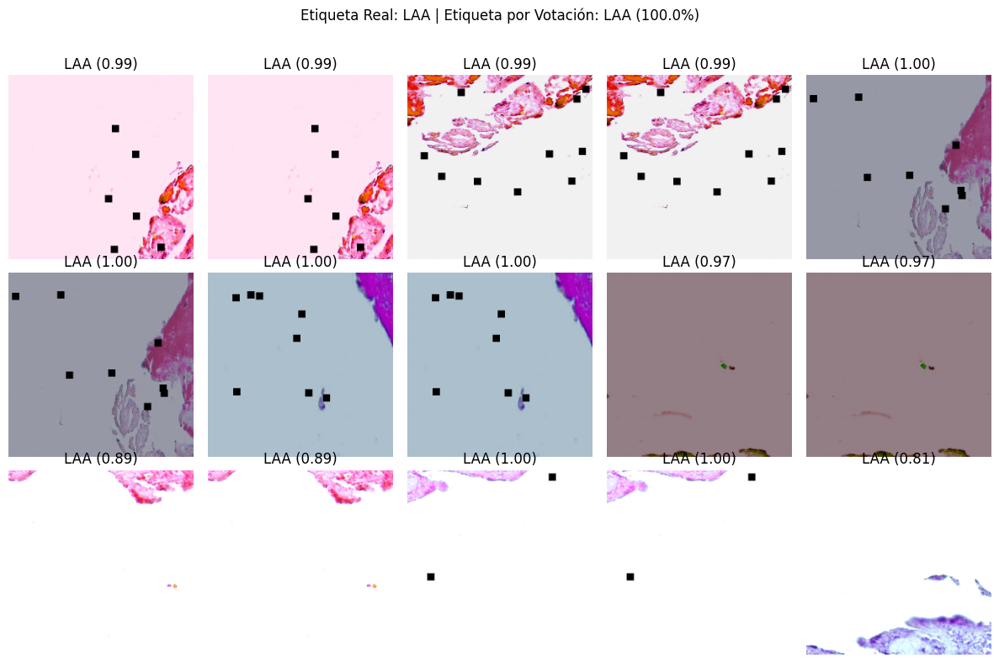

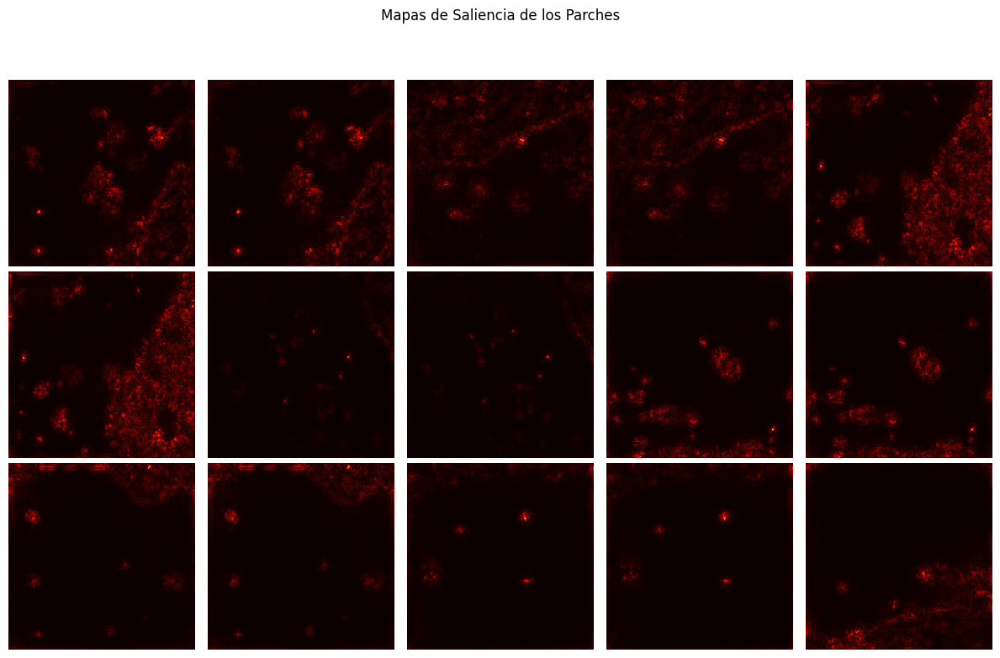

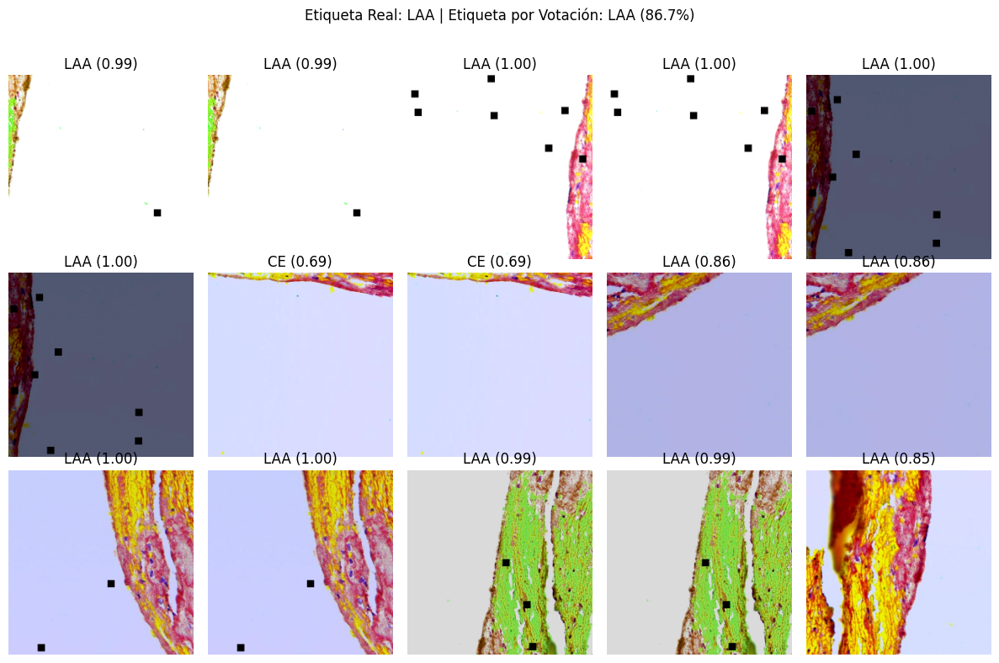

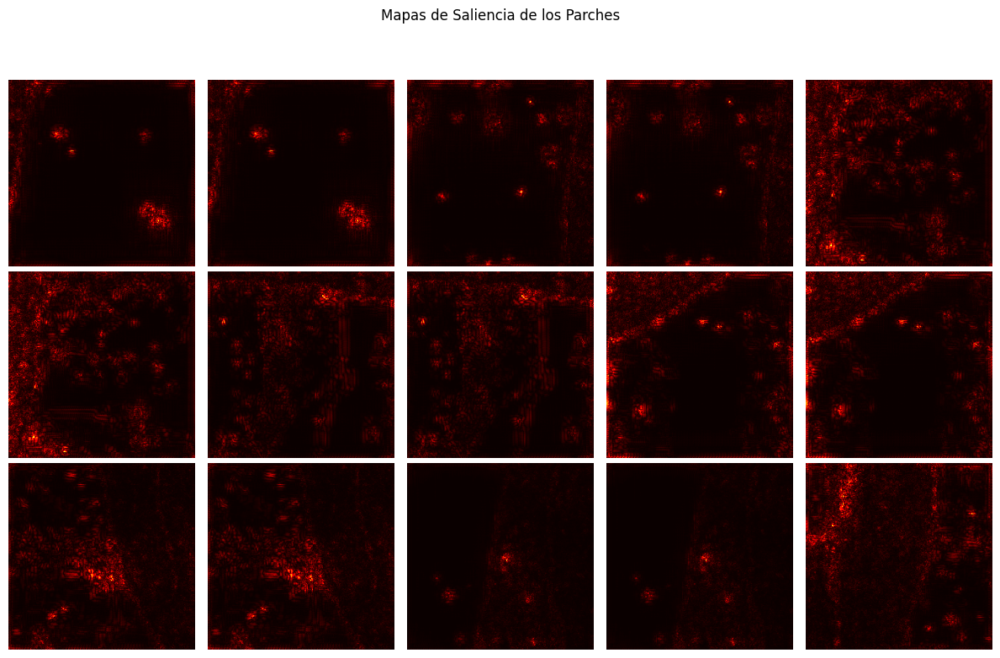

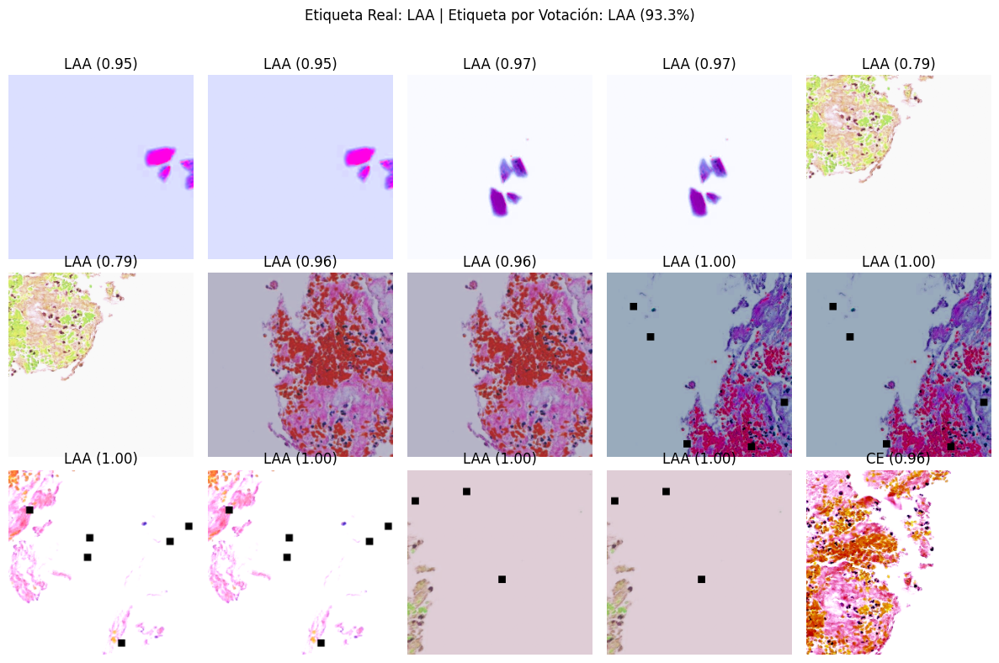

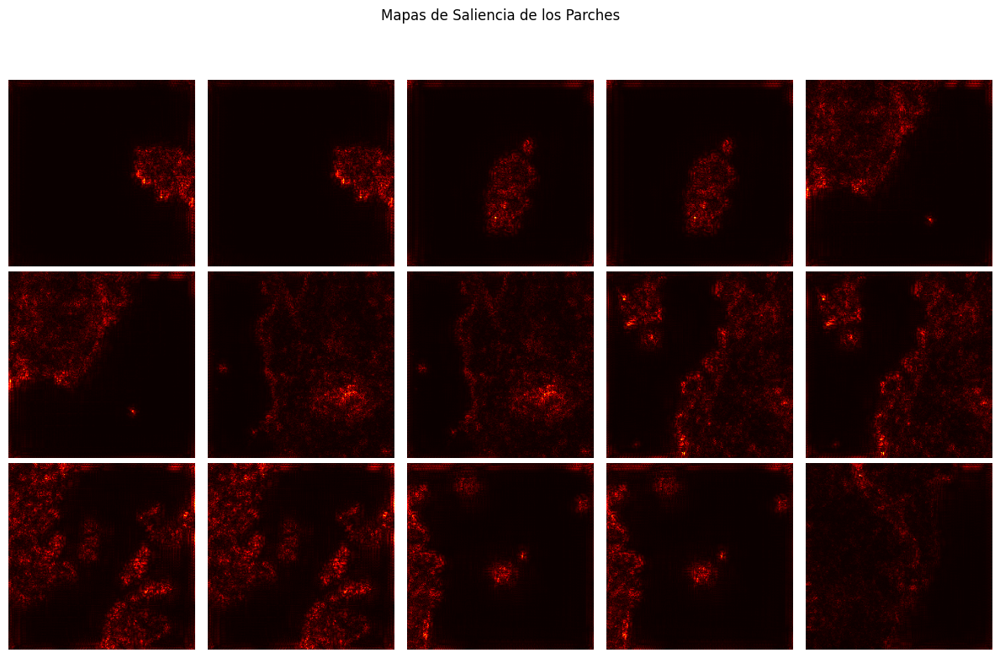

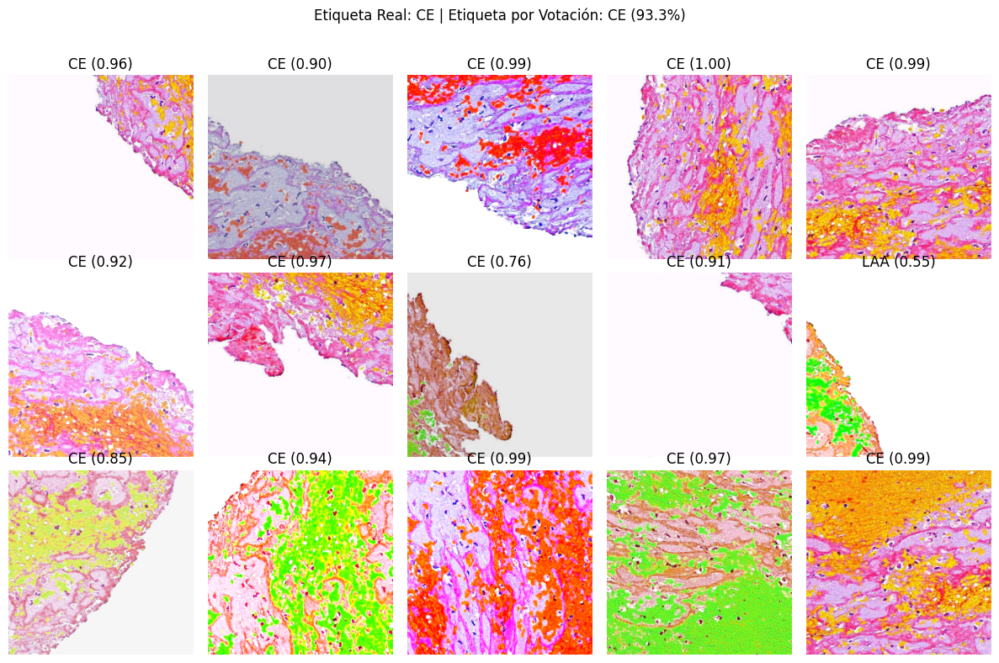

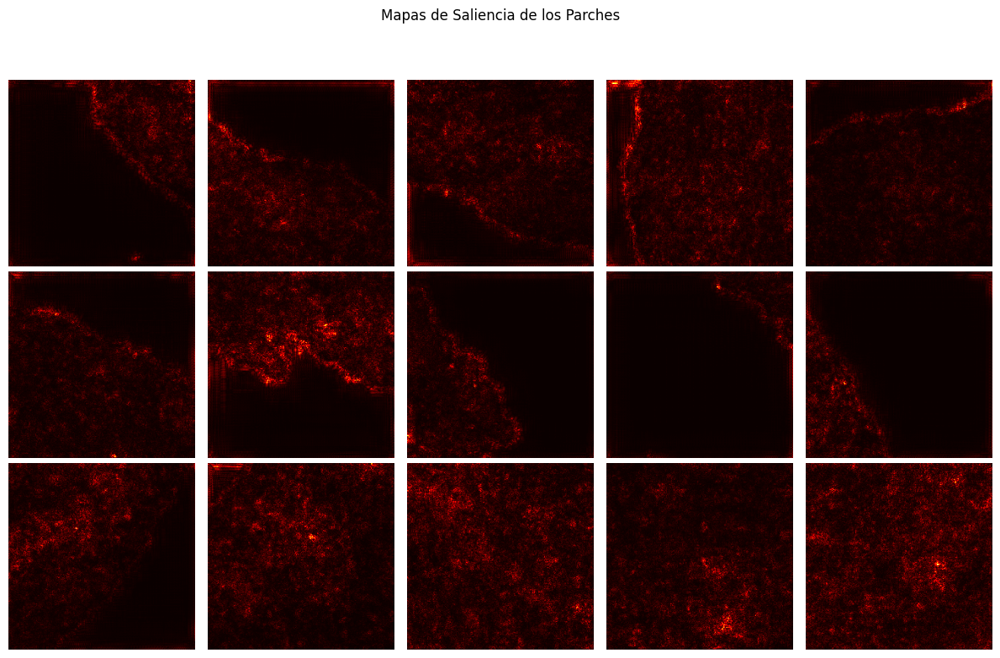

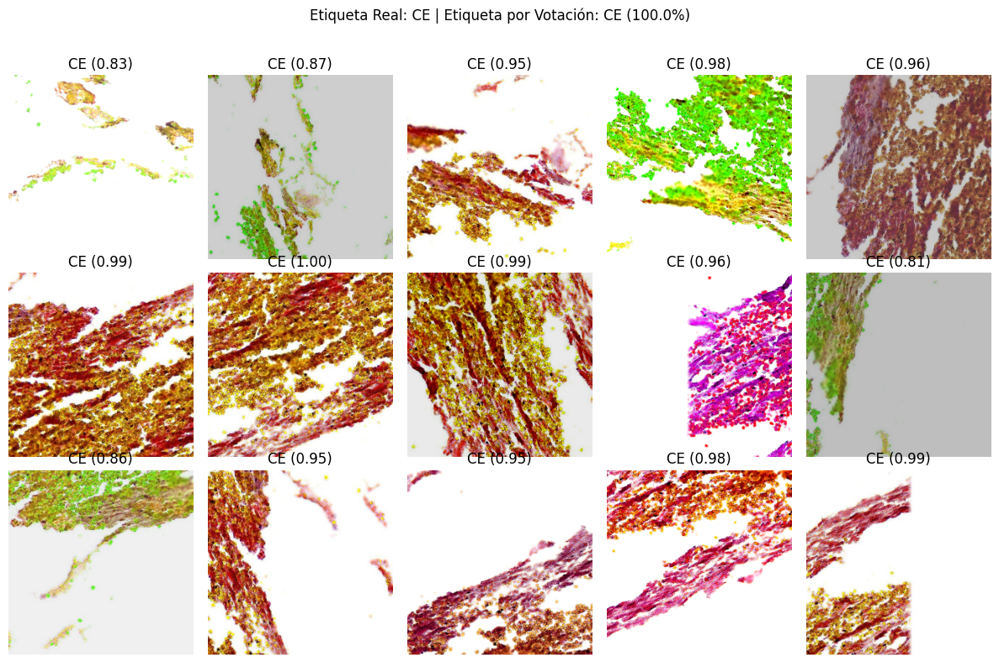

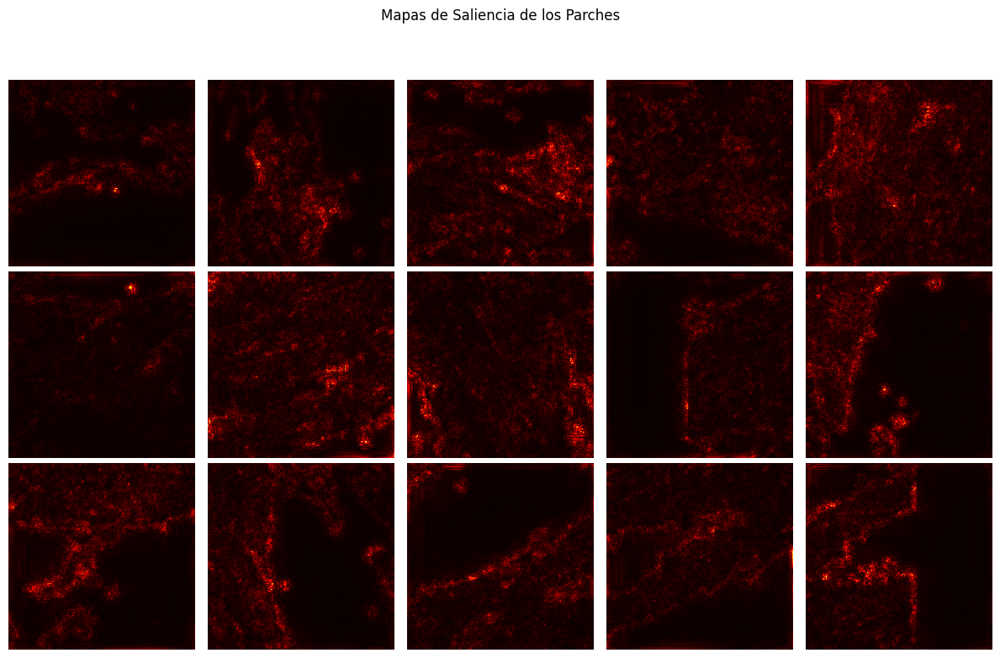

In [ ]:
# Cargar el modelo entrenado en el mejor fold (reemplaza 'best_model.pth' si deseas utilizar un modelo diferente)
model = EfficientNetClassifier(num_classes).to(device)
model.load_state_dict(torch.load('best_model.pth'))
model.eval()

# Función para generar el mapa de saliencia
def generate_saliency_map(model, image_tensor, label_index):
    model.eval()

    # Habilitar los gradientes para la imagen
    image_tensor = image_tensor.to(device).requires_grad_()

    # Pasar la imagen a través del modelo para obtener la salida
    output = model(image_tensor)
    target_output = output[0, label_index]

    # Calcular el gradiente de la salida objetivo con respecto a la entrada
    target_output.backward()

    # Obtener el gradiente absoluto para cada píxel
    saliency_map = image_tensor.grad.data.abs().squeeze().cpu().numpy()
    saliency_map = np.max(saliency_map, axis=0)

    # Normalizar el mapa de saliencia para resaltar
    saliency_map = (saliency_map - saliency_map.min()) / (saliency_map.max() - saliency_map.min())
    return saliency_map

# Seleccionar una muestra aleatoria de imágenes (conjunto de 5 imágenes completas, cada una con sus 15 parches)
sample_images = random.sample(list(np.unique([i // 15 for i in range(len(full_dataset))])), 5)

for img_idx in sample_images:
    patch_indices = range(img_idx * 15, (img_idx + 1) * 15)  # 15 parches por imagen
    votes = []
    true_label = full_dataset.le.inverse_transform([full_dataset[patch_indices[0]][1]])[0]

    # Configurar la cuadrícula de visualización de parches y sus predicciones
    fig, axes = plt.subplots(3, 5, figsize=(12, 8))  # 3 filas x 5 columnas para 15 parches
    fig.suptitle(f"Etiqueta Real: {true_label}")

    saliency_maps = []  # Lista para almacenar mapas de saliencia de cada parche

    for ax, idx in zip(axes.flatten(), patch_indices):
        image, _ = full_dataset[idx]
        image_np = image.numpy().transpose(1, 2, 0)

        # Realizar predicción para el parche
        image_tensor = image.unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(image_tensor)
            prob = torch.nn.functional.softmax(output, dim=1).cpu().numpy()[0]

        # Obtener la clase con mayor probabilidad y el mapa de saliencia
        pred_label_index = prob.argmax()
        pred_label = full_dataset.le.inverse_transform([pred_label_index])[0]
        votes.append(pred_label)
        top1_confidence = prob[pred_label_index]

        # Generar y guardar el mapa de saliencia
        saliency_map = generate_saliency_map(model, image_tensor, pred_label_index)
        saliency_maps.append(saliency_map)

        # Mostrar el parche y el título con la predicción principal
        ax.imshow(image_np)
        ax.set_title(f"{pred_label} ({top1_confidence:.2f})")
        ax.axis('off')

    # Realizar la votación entre los parches
    vote_counts = Counter(votes)
    voted_label = vote_counts.most_common(1)[0][0]
    vote_percentage = vote_counts.most_common(1)[0][1] / len(votes) * 100

    # Agregar la predicción final por votación en el título principal
    fig.suptitle(f"Etiqueta Real: {true_label} | Etiqueta por Votación: {voted_label} ({vote_percentage:.1f}%)")

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)  # Ajustar espacio superior para el título principal
    plt.show()

    # Visualizar solo los mapas de saliencia de cada parche en una nueva figura
    fig, axes = plt.subplots(3, 5, figsize=(12, 8))
    fig.suptitle("Mapas de Saliencia de los Parches")

    for ax, saliency_map in zip(axes.flatten(), saliency_maps):
        # Mostrar únicamente el mapa de saliencia
        ax.imshow(saliency_map, cmap='hot')
        ax.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()


In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay

<Figure size 1000x800 with 0 Axes>

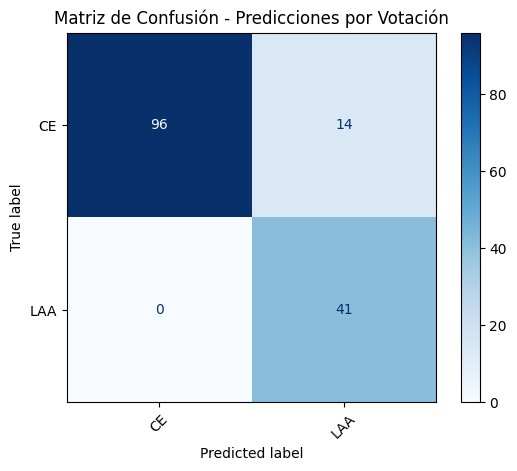

In [ ]:
# Variables para almacenar las etiquetas reales y las predicciones por votación
true_labels = []
voted_labels = []

# Realizar predicción por votación para todas las imágenes completas
num_images = len(full_dataset) // 15  # Número de imágenes completas, con 15 parches cada una

for img_idx in range(num_images):
    patch_indices = range(img_idx * 15, (img_idx + 1) * 15)  # 15 parches por imagen
    votes = []
    true_label = full_dataset.le.inverse_transform([full_dataset[patch_indices[0]][1]])[0]
    true_labels.append(true_label)  # Guardar la etiqueta real de la imagen

    # Obtener la predicción de cada parche y almacenar votos
    for idx in patch_indices:
        image, _ = full_dataset[idx]

        # Realizar predicción para el parche
        image_tensor = image.unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(image_tensor)
            prob = torch.nn.functional.softmax(output, dim=1).cpu().numpy()[0]

        # Obtener la clase con mayor probabilidad y agregar a votos
        pred_label_index = prob.argmax()
        pred_label = full_dataset.le.inverse_transform([pred_label_index])[0]
        votes.append(pred_label)

    # Realizar la votación entre los parches
    vote_counts = Counter(votes)
    voted_label = vote_counts.most_common(1)[0][0]
    voted_labels.append(voted_label)  # Guardar la predicción final para la imagen

# Calcular la matriz de confusión
conf_matrix = confusion_matrix(true_labels, voted_labels, labels=full_dataset.le.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=full_dataset.le.classes_)

# Mostrar la matriz de confusión
plt.figure(figsize=(10, 8))
disp.plot(cmap="Blues", xticks_rotation=45)
plt.title("Matriz de Confusión - Predicciones por Votación")
plt.show()


## Version 2
Usando todos los folds entrenamos nuevamente al modelo. Esto permitió que se disminiyera un poco los valores de perdida. Y por ende el sobreajuste. Sin embargo, redujó ligeramente la métrica de accuracy.

In [ ]:
# Definir el dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Usando el dispositivo: {device}')

# Definir la clase Dataset personalizada
class CustomImageDataset(Dataset):
    def __init__(self, data_dir, dataset_type):
        self.data_dir = data_dir
        self.dataset_type = dataset_type
        self.image_files = []
        self.labels = []

        # Cargar todos los archivos .npy
        for file_name in os.listdir(data_dir):
            if file_name.startswith(f'X_{dataset_type}_chunk_') and file_name.endswith('.npy'):
                chunk_index = file_name.split('_')[-1].split('.')[0]
                X_path = os.path.join(data_dir, file_name)
                y_path = os.path.join(data_dir, f'y_{dataset_type}_chunk_{chunk_index}.npy')
                if os.path.exists(y_path):
                    self.image_files.append(X_path)
                    self.labels.append(y_path)

        # Aplanar las listas de imágenes y etiquetas
        self.images = []
        self.targets = []
        for X_file, y_file in zip(self.image_files, self.labels):
            X_chunk = np.load(X_file)  # Forma: (num_imágenes, num_patches, C, H, W)
            y_chunk = np.load(y_file)  # Forma: (num_imágenes,)

            num_images, num_patches, C, H, W = X_chunk.shape
            # Aplanar los parches
            X_chunk = X_chunk.reshape(-1, C, H, W)  # Nueva forma: (num_imágenes * num_patches, C, H, W)
            # Repetir las etiquetas para cada parche
            y_chunk = np.repeat(y_chunk, num_patches)

            self.images.extend(X_chunk)
            self.targets.extend(y_chunk)

        # Codificar las etiquetas
        self.le = LabelEncoder()
        self.targets = self.le.fit_transform(self.targets)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        image = self.images[idx]
        # Normalizar las imágenes
        image = image.astype(np.float32) / 255.0
        # Convertir a tensor
        image = torch.tensor(image)
        label = self.targets[idx]
        return image, label

# Función para crear el DataLoader con WeightedRandomSampler
def create_data_loader(dataset, batch_size):
    class_sample_count = np.array([len(np.where(dataset.targets == t)[0]) for t in np.unique(dataset.targets)])
    weight = 1. / class_sample_count
    samples_weight = np.array([weight[t] for t in dataset.targets])

    samples_weight = torch.from_numpy(samples_weight)
    sampler = WeightedRandomSampler(samples_weight.type('torch.DoubleTensor'), len(samples_weight))

    data_loader = DataLoader(dataset, batch_size=batch_size, sampler=sampler, num_workers=4)
    return data_loader

# Definir el modelo
class EfficientNetClassifier(nn.Module):
    def __init__(self, num_classes):
        super(EfficientNetClassifier, self).__init__()
        self.model = efficientnet_b0(weights=EfficientNet_B0_Weights.DEFAULT)
        self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, num_classes)

    def forward(self, x):
        return self.model(x)

# Ruta a los datos
data_dir = danielvaldez202021_proyect_ds_dataset_path  # Reemplaza con la ruta real a tus datos

# Parámetros
batch_size = 32
num_epochs = 10
learning_rate = 1e-4
num_folds = 5

# Configuración de Cross-Validation
all_val_true = []
all_val_preds = []

for fold in range(num_folds):
    print(f'\nFold {fold+1}/{num_folds}')

    # Crear datasets para el fold actual
    train_dataset = CustomImageDataset(data_dir, f'train_fold{fold}')
    val_dataset = CustomImageDataset(data_dir, f'val_fold{fold}')

    train_loader = create_data_loader(train_dataset, batch_size)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    # Inicializar el modelo, pérdida y optimizador
    num_classes = len(np.unique(train_dataset.targets))
    model = EfficientNetClassifier(num_classes).to(device)

    class_counts = np.bincount(train_dataset.targets)
    class_weights = 1. / class_counts
    class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
    criterion = nn.CrossEntropyLoss(weight=class_weights)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # Entrenamiento para el fold actual
    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        model.train()
        running_loss = 0.0
        for images, labels in tqdm(train_loader, desc='Entrenando'):
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
        train_loss = running_loss / len(train_loader.dataset)
        print(f'Pérdida de entrenamiento: {train_loss:.4f}')

        # Evaluación en el conjunto de validación
        model.eval()
        val_preds, val_true = [], []
        val_loss = 0.0
        with torch.no_grad():
            for images, labels in tqdm(val_loader, desc='Validando'):
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)

                _, predicted = torch.max(outputs, 1)
                val_preds.extend(predicted.cpu().numpy())
                val_true.extend(labels.cpu().numpy())
        val_loss /= len(val_loader.dataset)
        print(f'Pérdida de validación: {val_loss:.4f}')

        # Guardar predicciones y etiquetas verdaderas para métricas de validación
        all_val_true.extend(val_true)
        all_val_preds.extend(val_preds)

    # Métricas del fold
    print('Reporte de clasificación:')
    print(classification_report(val_true, val_preds, target_names=train_dataset.le.classes_))
    print('Matriz de confusión:')
    print(confusion_matrix(val_true, val_preds))

# Métricas generales de los 5 folds
print("\nResultados de los 5 folds:")
print(classification_report(all_val_true, all_val_preds, target_names=train_dataset.le.classes_))
print("Matriz de confusión acumulada:")
print(confusion_matrix(all_val_true, all_val_preds))


Usando el dispositivo: cuda

Fold 1/5
Epoch 1/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.17it/s]


Pérdida de entrenamiento: 0.3058


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.35it/s]


Pérdida de validación: 0.3519
Epoch 2/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.19it/s]


Pérdida de entrenamiento: 0.1525


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.18it/s]


Pérdida de validación: 0.3654
Epoch 3/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.17it/s]


Pérdida de entrenamiento: 0.0795


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.54it/s]


Pérdida de validación: 0.4549
Epoch 4/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.17it/s]


Pérdida de entrenamiento: 0.0591


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.39it/s]


Pérdida de validación: 0.4822
Epoch 5/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.17it/s]


Pérdida de entrenamiento: 0.0450


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.39it/s]


Pérdida de validación: 0.4957
Epoch 6/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.17it/s]


Pérdida de entrenamiento: 0.0383


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.48it/s]


Pérdida de validación: 0.5053
Epoch 7/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.17it/s]


Pérdida de entrenamiento: 0.0344


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.36it/s]


Pérdida de validación: 0.5210
Epoch 8/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.18it/s]


Pérdida de entrenamiento: 0.0231


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.44it/s]


Pérdida de validación: 0.6929
Epoch 9/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.19it/s]


Pérdida de entrenamiento: 0.0226


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.60it/s]


Pérdida de validación: 0.5807
Epoch 10/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.19it/s]


Pérdida de entrenamiento: 0.0188


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.49it/s]


Pérdida de validación: 0.6872
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.89      0.98      0.93      1650
         LAA       0.92      0.68      0.78       615

    accuracy                           0.90      2265
   macro avg       0.91      0.83      0.86      2265
weighted avg       0.90      0.90      0.89      2265

Matriz de confusión:
[[1615   35]
 [ 197  418]]

Fold 2/5
Epoch 1/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.20it/s]


Pérdida de entrenamiento: 0.3201


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.58it/s]


Pérdida de validación: 0.3791
Epoch 2/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.23it/s]


Pérdida de entrenamiento: 0.1563


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.75it/s]


Pérdida de validación: 0.4036
Epoch 3/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.0864


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.92it/s]


Pérdida de validación: 0.4782
Epoch 4/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.20it/s]


Pérdida de entrenamiento: 0.0683


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.68it/s]


Pérdida de validación: 0.5151
Epoch 5/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.21it/s]


Pérdida de entrenamiento: 0.0435


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.91it/s]


Pérdida de validación: 0.5838
Epoch 6/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.21it/s]


Pérdida de entrenamiento: 0.0383


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.76it/s]


Pérdida de validación: 0.5836
Epoch 7/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.21it/s]


Pérdida de entrenamiento: 0.0288


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.74it/s]


Pérdida de validación: 0.6663
Epoch 8/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.0253


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.76it/s]


Pérdida de validación: 0.7255
Epoch 9/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.21it/s]


Pérdida de entrenamiento: 0.0263


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.77it/s]


Pérdida de validación: 0.6743
Epoch 10/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.0225


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.82it/s]


Pérdida de validación: 0.7316
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.89      0.98      0.93      1650
         LAA       0.91      0.68      0.78       615

    accuracy                           0.90      2265
   macro avg       0.90      0.83      0.86      2265
weighted avg       0.90      0.90      0.89      2265

Matriz de confusión:
[[1609   41]
 [ 194  421]]

Fold 3/5
Epoch 1/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.3220


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.70it/s]


Pérdida de validación: 0.3545
Epoch 2/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.23it/s]


Pérdida de entrenamiento: 0.1661


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.71it/s]


Pérdida de validación: 0.3720
Epoch 3/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.0932


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.87it/s]


Pérdida de validación: 0.4341
Epoch 4/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.21it/s]


Pérdida de entrenamiento: 0.0599


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.90it/s]


Pérdida de validación: 0.5313
Epoch 5/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.20it/s]


Pérdida de entrenamiento: 0.0457


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.68it/s]


Pérdida de validación: 0.6124
Epoch 6/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.0328


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.64it/s]


Pérdida de validación: 0.7252
Epoch 7/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.21it/s]


Pérdida de entrenamiento: 0.0307


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.59it/s]


Pérdida de validación: 0.6671
Epoch 8/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.21it/s]


Pérdida de entrenamiento: 0.0300


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.88it/s]


Pérdida de validación: 0.6743
Epoch 9/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.21it/s]


Pérdida de entrenamiento: 0.0227


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.88it/s]


Pérdida de validación: 0.7284
Epoch 10/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.21it/s]


Pérdida de entrenamiento: 0.0206


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.72it/s]


Pérdida de validación: 0.7903
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.89      0.96      0.92      1635
         LAA       0.87      0.69      0.77       630

    accuracy                           0.88      2265
   macro avg       0.88      0.82      0.85      2265
weighted avg       0.88      0.88      0.88      2265

Matriz de confusión:
[[1571   64]
 [ 198  432]]

Fold 4/5
Epoch 1/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.3166


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.83it/s]


Pérdida de validación: 0.3969
Epoch 2/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.1479


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.69it/s]


Pérdida de validación: 0.4207
Epoch 3/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.0941


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.85it/s]


Pérdida de validación: 0.4851
Epoch 4/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.20it/s]


Pérdida de entrenamiento: 0.0512


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.90it/s]


Pérdida de validación: 0.5488
Epoch 5/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.20it/s]


Pérdida de entrenamiento: 0.0392


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.99it/s]


Pérdida de validación: 0.6445
Epoch 6/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.0356


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.68it/s]


Pérdida de validación: 0.6863
Epoch 7/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.21it/s]


Pérdida de entrenamiento: 0.0304


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.46it/s]


Pérdida de validación: 0.6453
Epoch 8/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.0233


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.88it/s]


Pérdida de validación: 0.7461
Epoch 9/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.0189


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.86it/s]


Pérdida de validación: 0.8095
Epoch 10/10


Entrenando: 100%|██████████| 283/283 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.0280


Validando: 100%|██████████| 71/71 [00:04<00:00, 15.35it/s]


Pérdida de validación: 0.7521
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.89      0.94      0.91      1635
         LAA       0.83      0.68      0.75       630

    accuracy                           0.87      2265
   macro avg       0.86      0.81      0.83      2265
weighted avg       0.87      0.87      0.87      2265

Matriz de confusión:
[[1544   91]
 [ 200  430]]

Fold 5/5
Epoch 1/10


Entrenando: 100%|██████████| 284/284 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.3121


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.70it/s]


Pérdida de validación: 0.4006
Epoch 2/10


Entrenando: 100%|██████████| 284/284 [00:54<00:00,  5.23it/s]


Pérdida de entrenamiento: 0.1614


Validando: 100%|██████████| 71/71 [00:04<00:00, 17.05it/s]


Pérdida de validación: 0.3782
Epoch 3/10


Entrenando: 100%|██████████| 284/284 [00:54<00:00,  5.23it/s]


Pérdida de entrenamiento: 0.0877


Validando: 100%|██████████| 71/71 [00:04<00:00, 17.09it/s]


Pérdida de validación: 0.4907
Epoch 4/10


Entrenando: 100%|██████████| 284/284 [00:54<00:00,  5.24it/s]


Pérdida de entrenamiento: 0.0606


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.97it/s]


Pérdida de validación: 0.5553
Epoch 5/10


Entrenando: 100%|██████████| 284/284 [00:54<00:00,  5.23it/s]


Pérdida de entrenamiento: 0.0486


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.76it/s]


Pérdida de validación: 0.6264
Epoch 6/10


Entrenando: 100%|██████████| 284/284 [00:54<00:00,  5.24it/s]


Pérdida de entrenamiento: 0.0395


Validando: 100%|██████████| 71/71 [00:04<00:00, 17.03it/s]


Pérdida de validación: 0.6678
Epoch 7/10


Entrenando: 100%|██████████| 284/284 [00:54<00:00,  5.23it/s]


Pérdida de entrenamiento: 0.0327


Validando: 100%|██████████| 71/71 [00:04<00:00, 17.12it/s]


Pérdida de validación: 0.6697
Epoch 8/10


Entrenando: 100%|██████████| 284/284 [00:54<00:00,  5.22it/s]


Pérdida de entrenamiento: 0.0326


Validando: 100%|██████████| 71/71 [00:04<00:00, 17.00it/s]


Pérdida de validación: 0.6667
Epoch 9/10


Entrenando: 100%|██████████| 284/284 [00:54<00:00,  5.23it/s]


Pérdida de entrenamiento: 0.0222


Validando: 100%|██████████| 71/71 [00:04<00:00, 17.04it/s]


Pérdida de validación: 0.7968
Epoch 10/10


Entrenando: 100%|██████████| 284/284 [00:54<00:00,  5.23it/s]


Pérdida de entrenamiento: 0.0312


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.79it/s]


Pérdida de validación: 0.8504
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.88      0.97      0.92      1635
         LAA       0.88      0.67      0.76       615

    accuracy                           0.88      2250
   macro avg       0.88      0.82      0.84      2250
weighted avg       0.88      0.88      0.88      2250

Matriz de confusión:
[[1580   55]
 [ 206  409]]

Resultados de los 5 folds:
              precision    recall  f1-score   support

          CE       0.90      0.94      0.92     82050
         LAA       0.82      0.71      0.76     31050

    accuracy                           0.88    113100
   macro avg       0.86      0.83      0.84    113100
weighted avg       0.88      0.88      0.88    113100

Matriz de confusión acumulada:
[[77243  4807]
 [ 8977 22073]]


### Gráficas más mapas de salencias.

<ipython-input-56-a006e0a264ed>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model.pth'))


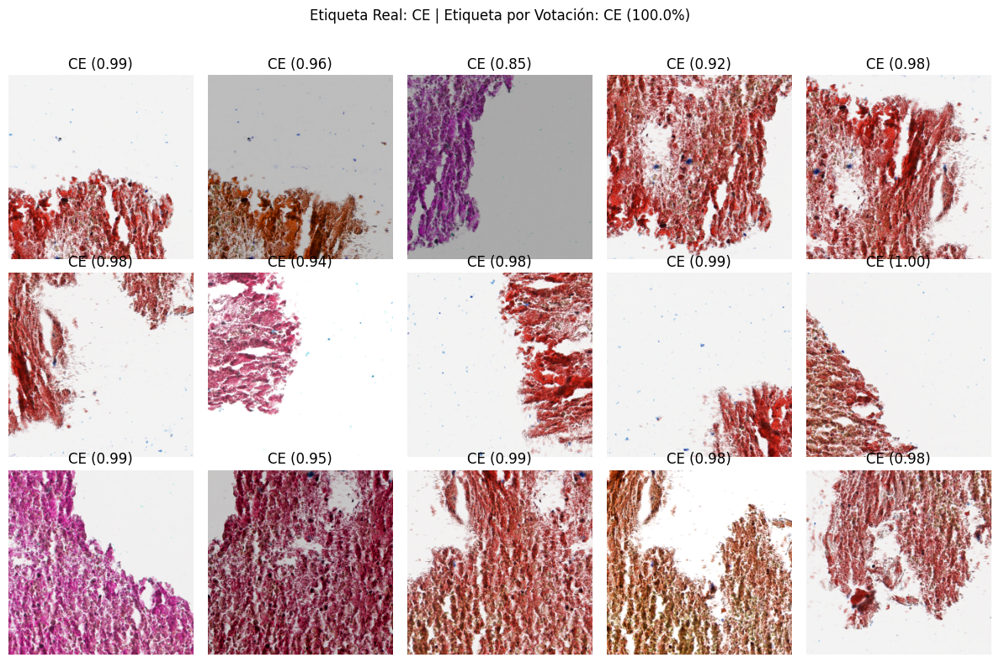

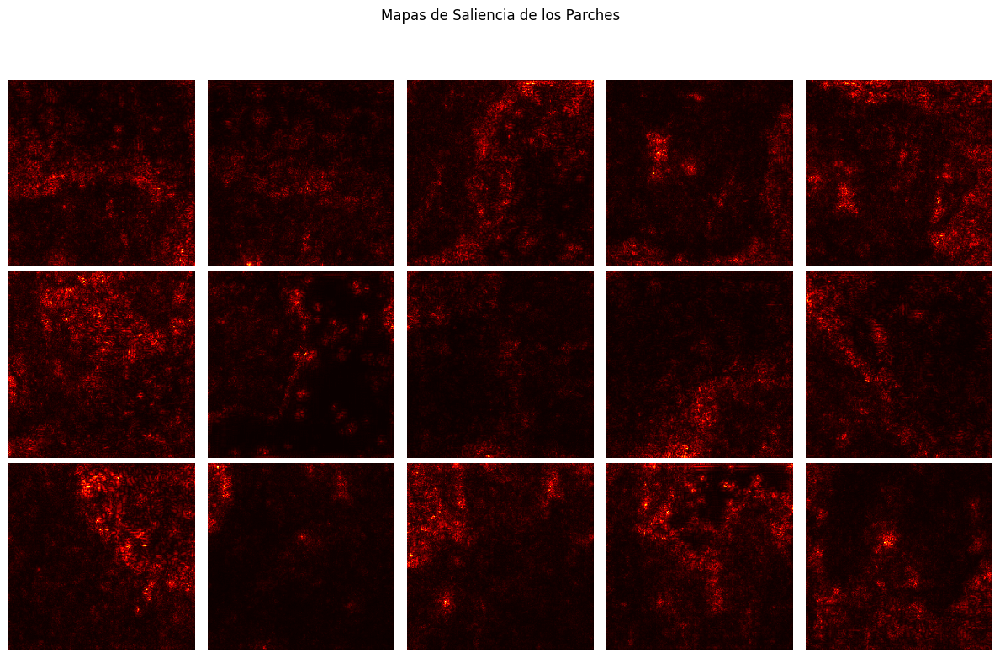

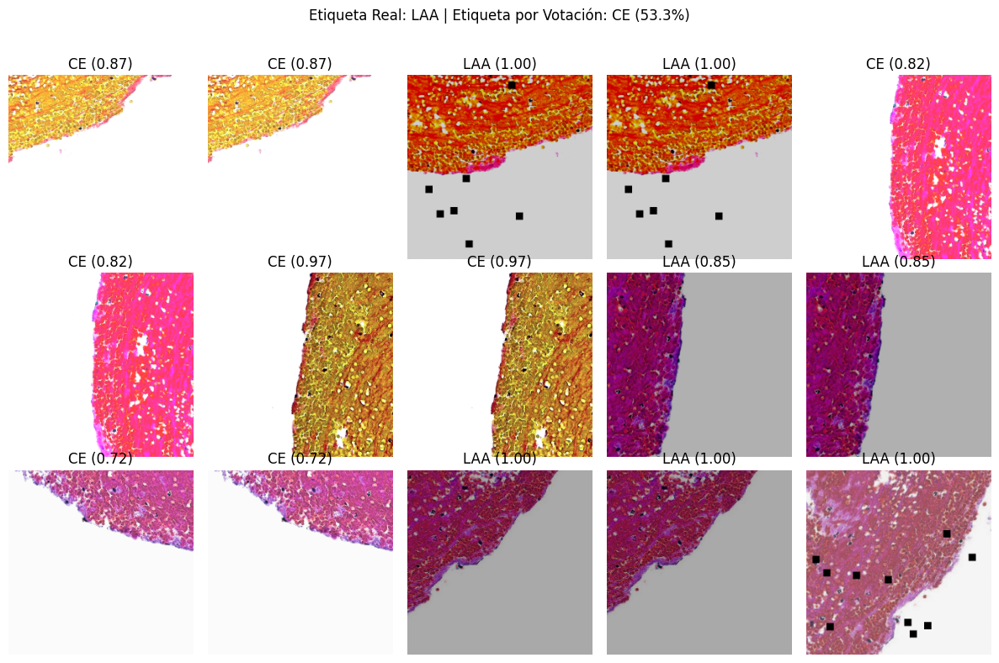

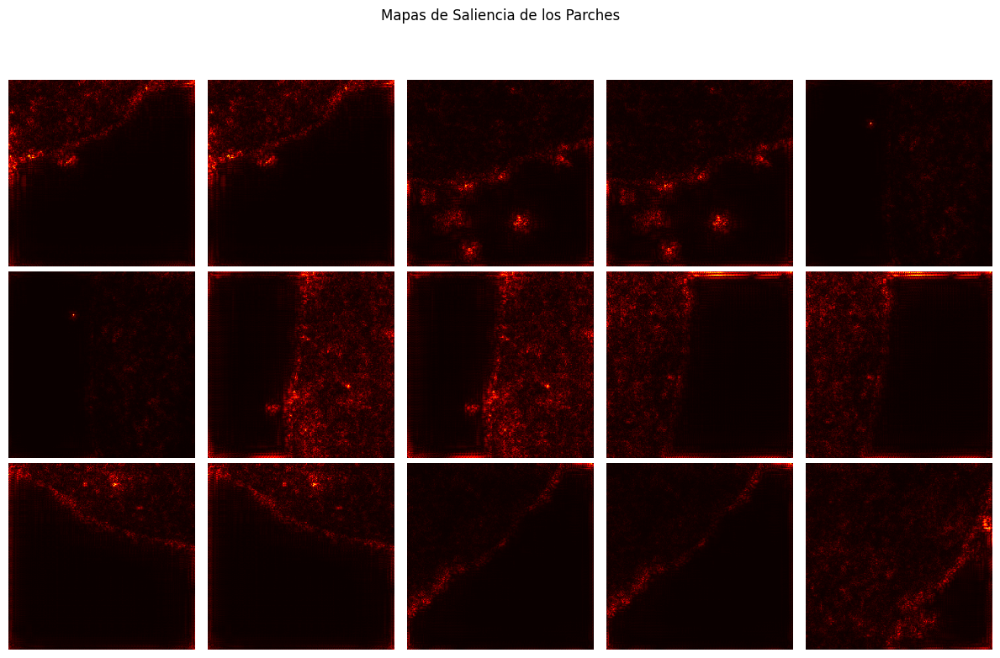

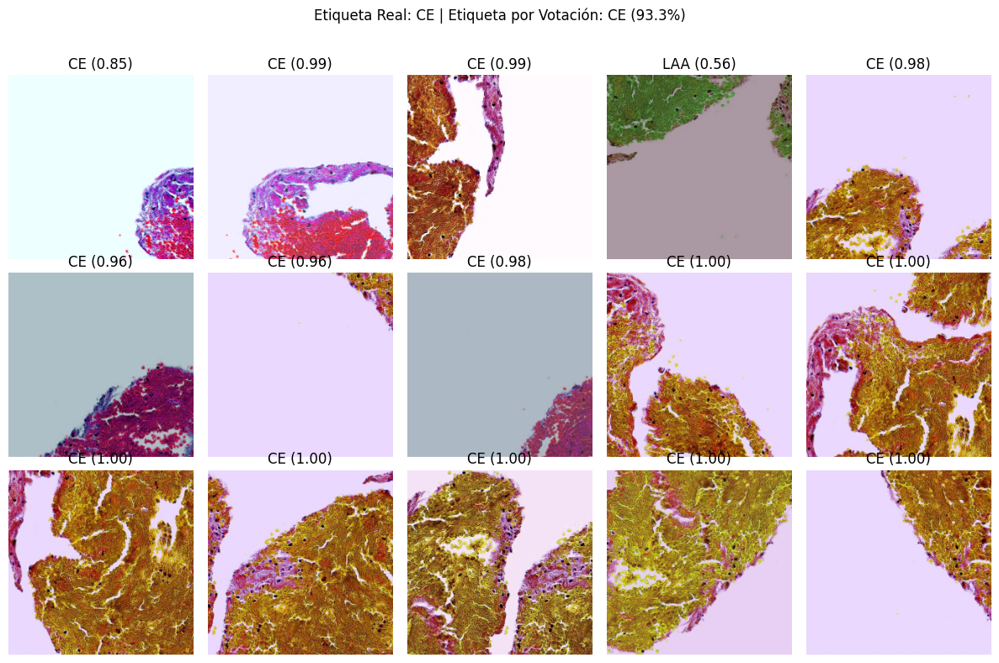

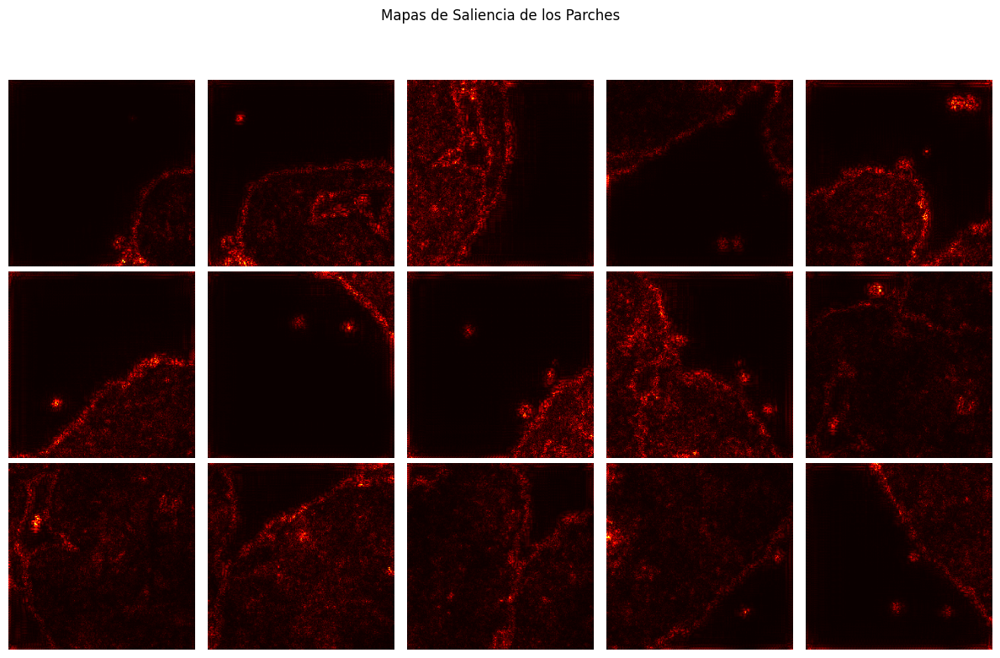

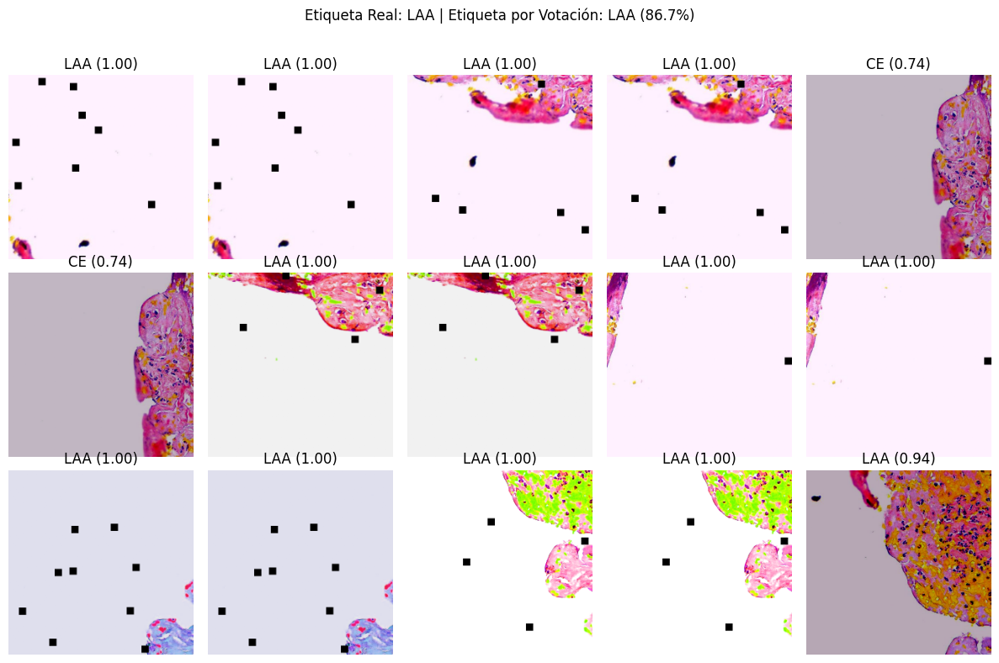

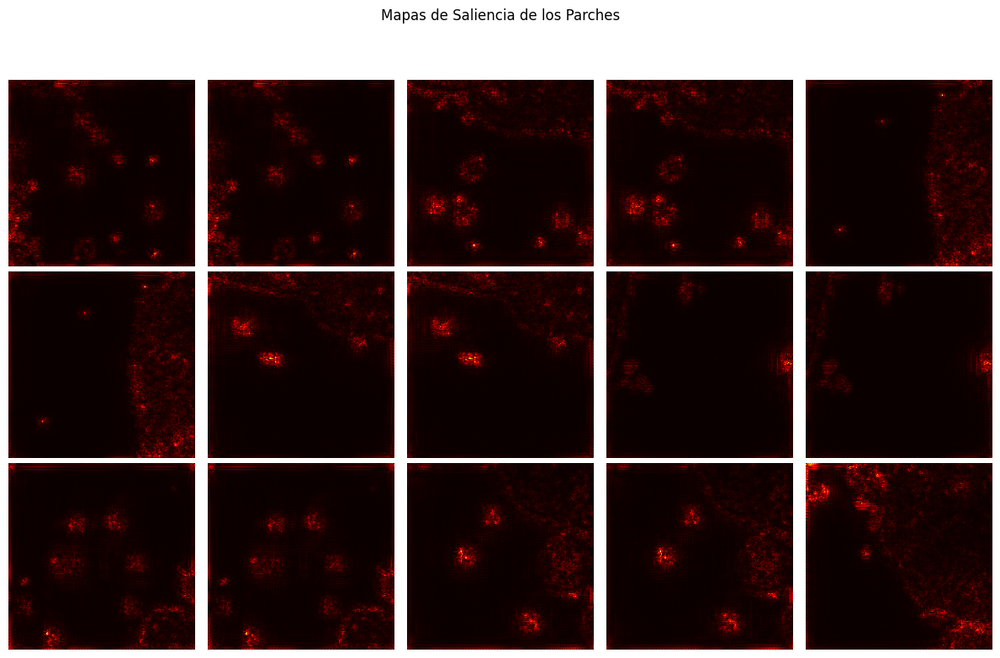

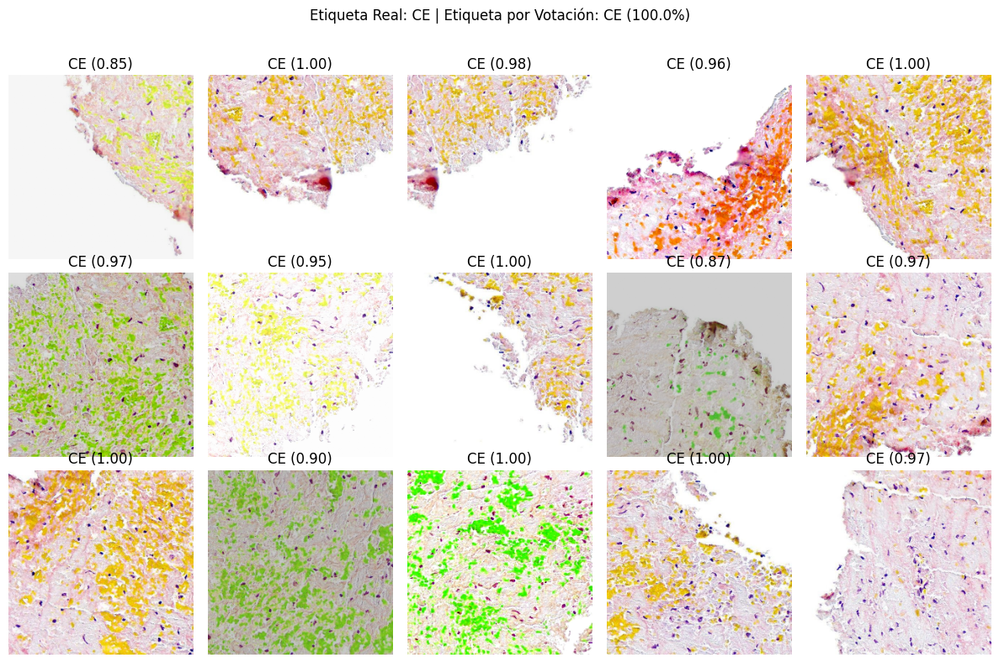

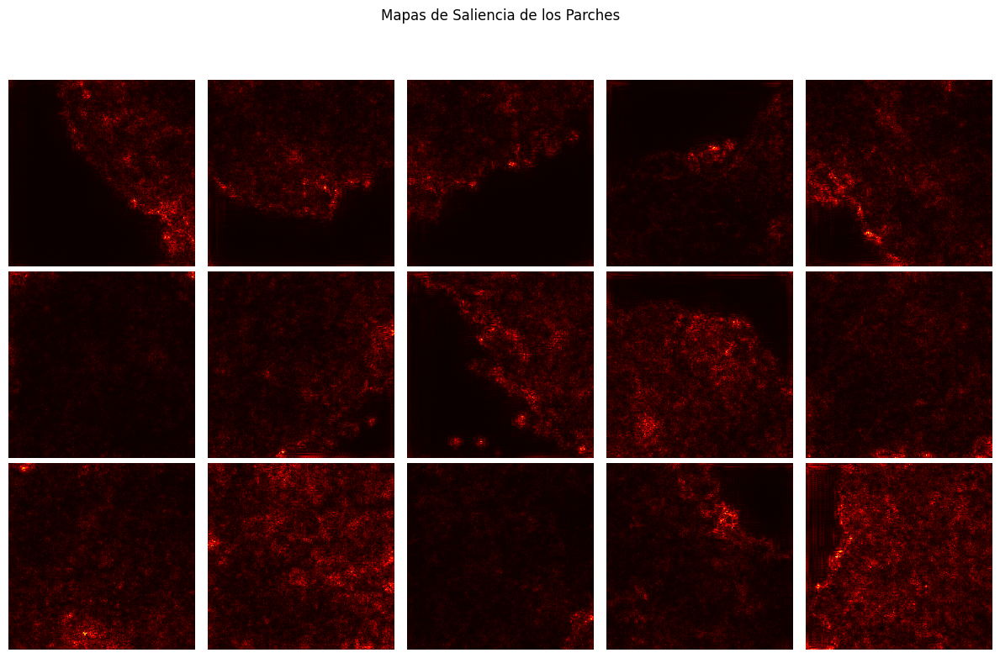

In [ ]:
# Cargar el modelo entrenado en el mejor fold (reemplaza 'best_model.pth' si deseas utilizar un modelo diferente)
model = EfficientNetClassifier(num_classes).to(device)
model.load_state_dict(torch.load('best_model.pth'))
model.eval()

# Función para generar el mapa de saliencia
def generate_saliency_map(model, image_tensor, label_index):
    model.eval()

    # Habilitar los gradientes para la imagen
    image_tensor = image_tensor.to(device).requires_grad_()

    # Pasar la imagen a través del modelo para obtener la salida
    output = model(image_tensor)
    target_output = output[0, label_index]

    # Calcular el gradiente de la salida objetivo con respecto a la entrada
    target_output.backward()

    # Obtener el gradiente absoluto para cada píxel
    saliency_map = image_tensor.grad.data.abs().squeeze().cpu().numpy()
    saliency_map = np.max(saliency_map, axis=0)

    # Normalizar el mapa de saliencia para resaltar
    saliency_map = (saliency_map - saliency_map.min()) / (saliency_map.max() - saliency_map.min())
    return saliency_map

# Seleccionar una muestra aleatoria de imágenes (conjunto de 5 imágenes completas, cada una con sus 15 parches)
sample_images = random.sample(list(np.unique([i // 15 for i in range(len(full_dataset))])), 5)

for img_idx in sample_images:
    patch_indices = range(img_idx * 15, (img_idx + 1) * 15)  # 15 parches por imagen
    votes = []
    true_label = full_dataset.le.inverse_transform([full_dataset[patch_indices[0]][1]])[0]

    # Configurar la cuadrícula de visualización de parches y sus predicciones
    fig, axes = plt.subplots(3, 5, figsize=(12, 8))  # 3 filas x 5 columnas para 15 parches
    fig.suptitle(f"Etiqueta Real: {true_label}")

    saliency_maps = []  # Lista para almacenar mapas de saliencia de cada parche

    for ax, idx in zip(axes.flatten(), patch_indices):
        image, _ = full_dataset[idx]
        image_np = image.numpy().transpose(1, 2, 0)

        # Realizar predicción para el parche
        image_tensor = image.unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(image_tensor)
            prob = torch.nn.functional.softmax(output, dim=1).cpu().numpy()[0]

        # Obtener la clase con mayor probabilidad y el mapa de saliencia
        pred_label_index = prob.argmax()
        pred_label = full_dataset.le.inverse_transform([pred_label_index])[0]
        votes.append(pred_label)
        top1_confidence = prob[pred_label_index]

        # Generar y guardar el mapa de saliencia
        saliency_map = generate_saliency_map(model, image_tensor, pred_label_index)
        saliency_maps.append(saliency_map)

        # Mostrar el parche y el título con la predicción principal
        ax.imshow(image_np)
        ax.set_title(f"{pred_label} ({top1_confidence:.2f})")
        ax.axis('off')

    # Realizar la votación entre los parches
    vote_counts = Counter(votes)
    voted_label = vote_counts.most_common(1)[0][0]
    vote_percentage = vote_counts.most_common(1)[0][1] / len(votes) * 100

    # Agregar la predicción final por votación en el título principal
    fig.suptitle(f"Etiqueta Real: {true_label} | Etiqueta por Votación: {voted_label} ({vote_percentage:.1f}%)")

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)  # Ajustar espacio superior para el título principal
    plt.show()

    # Visualizar solo los mapas de saliencia de cada parche en una nueva figura
    fig, axes = plt.subplots(3, 5, figsize=(12, 8))
    fig.suptitle("Mapas de Saliencia de los Parches")

    for ax, saliency_map in zip(axes.flatten(), saliency_maps):
        # Mostrar únicamente el mapa de saliencia
        ax.imshow(saliency_map, cmap='hot')
        ax.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()


## Version 3.
Usando tecnicas como dropout. Se intentó disminiur el nivel de sobre ajuste que tiene el modelo. Sin embargo aunque sigue teniendo una pérdida considerable, demuestra un comportacmiento mas coherente y mantuvo una buena metrica de accuracy.

Usando el dispositivo: cuda
Epoch 1/10


Validando: 100%|██████████| 36/36 [00:03<00:00,  9.94it/s]


Pérdida de entrenamiento: 0.4479
Pérdida de validación: 0.4614
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.84      0.93      0.88      1650
         LAA       0.75      0.52      0.61       615

    accuracy                           0.82      2265
   macro avg       0.79      0.73      0.75      2265
weighted avg       0.81      0.82      0.81      2265

Matriz de confusión:
[[1542  108]
 [ 294  321]]
Modelo mejorado y guardado.
Epoch 2/10


Validando: 100%|██████████| 36/36 [00:03<00:00,  9.86it/s]


Pérdida de entrenamiento: 0.3669
Pérdida de validación: 0.4250
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.83      0.96      0.89      1650
         LAA       0.84      0.48      0.61       615

    accuracy                           0.83      2265
   macro avg       0.83      0.72      0.75      2265
weighted avg       0.83      0.83      0.82      2265

Matriz de confusión:
[[1592   58]
 [ 319  296]]
Modelo mejorado y guardado.
Epoch 3/10


Validando: 100%|██████████| 36/36 [00:03<00:00,  9.69it/s]


Pérdida de entrenamiento: 0.3495
Pérdida de validación: 0.4189
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.85      0.93      0.89      1650
         LAA       0.75      0.57      0.65       615

    accuracy                           0.83      2265
   macro avg       0.80      0.75      0.77      2265
weighted avg       0.83      0.83      0.82      2265

Matriz de confusión:
[[1536  114]
 [ 265  350]]
Modelo mejorado y guardado.
Epoch 4/10


Validando: 100%|██████████| 36/36 [00:03<00:00,  9.54it/s]


Pérdida de entrenamiento: 0.3308
Pérdida de validación: 0.4623
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.85      0.96      0.90      1650
         LAA       0.82      0.53      0.65       615

    accuracy                           0.84      2265
   macro avg       0.83      0.74      0.77      2265
weighted avg       0.84      0.84      0.83      2265

Matriz de confusión:
[[1578   72]
 [ 287  328]]
Epoch 5/10


Validando: 100%|██████████| 36/36 [00:03<00:00,  9.92it/s]


Pérdida de entrenamiento: 0.3149
Pérdida de validación: 0.4553
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.85      0.96      0.90      1650
         LAA       0.85      0.54      0.66       615

    accuracy                           0.85      2265
   macro avg       0.85      0.75      0.78      2265
weighted avg       0.85      0.85      0.84      2265

Matriz de confusión:
[[1590   60]
 [ 284  331]]
Epoch 6/10


Validando: 100%|██████████| 36/36 [00:03<00:00,  9.56it/s]


Pérdida de entrenamiento: 0.2959
Pérdida de validación: 0.4684
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.85      0.95      0.90      1650
         LAA       0.82      0.56      0.66       615

    accuracy                           0.85      2265
   macro avg       0.83      0.76      0.78      2265
weighted avg       0.84      0.85      0.84      2265

Matriz de confusión:
[[1572   78]
 [ 271  344]]
Epoch 7/10


Validando: 100%|██████████| 36/36 [00:03<00:00,  9.65it/s]


Pérdida de entrenamiento: 0.2873
Pérdida de validación: 0.4709
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.85      0.96      0.90      1650
         LAA       0.84      0.56      0.67       615

    accuracy                           0.85      2265
   macro avg       0.85      0.76      0.79      2265
weighted avg       0.85      0.85      0.84      2265

Matriz de confusión:
[[1583   67]
 [ 270  345]]
Epoch 8/10


Validando: 100%|██████████| 36/36 [00:03<00:00,  9.46it/s]


Pérdida de entrenamiento: 0.2845
Pérdida de validación: 0.4878
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.85      0.95      0.90      1650
         LAA       0.82      0.55      0.66       615

    accuracy                           0.84      2265
   macro avg       0.83      0.75      0.78      2265
weighted avg       0.84      0.84      0.83      2265

Matriz de confusión:
[[1575   75]
 [ 277  338]]
Epoch 9/10


Validando: 100%|██████████| 36/36 [00:03<00:00,  9.86it/s]


Pérdida de entrenamiento: 0.2764
Pérdida de validación: 0.5084
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.85      0.96      0.90      1650
         LAA       0.82      0.56      0.67       615

    accuracy                           0.85      2265
   macro avg       0.84      0.76      0.78      2265
weighted avg       0.85      0.85      0.84      2265

Matriz de confusión:
[[1576   74]
 [ 271  344]]
Epoch 10/10


Validando: 100%|██████████| 36/36 [00:03<00:00,  9.79it/s]


Pérdida de entrenamiento: 0.2770
Pérdida de validación: 0.4902
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.85      0.96      0.90      1650
         LAA       0.84      0.55      0.66       615

    accuracy                           0.85      2265
   macro avg       0.85      0.75      0.78      2265
weighted avg       0.85      0.85      0.84      2265

Matriz de confusión:
[[1587   63]
 [ 279  336]]
Entrenamiento completado.


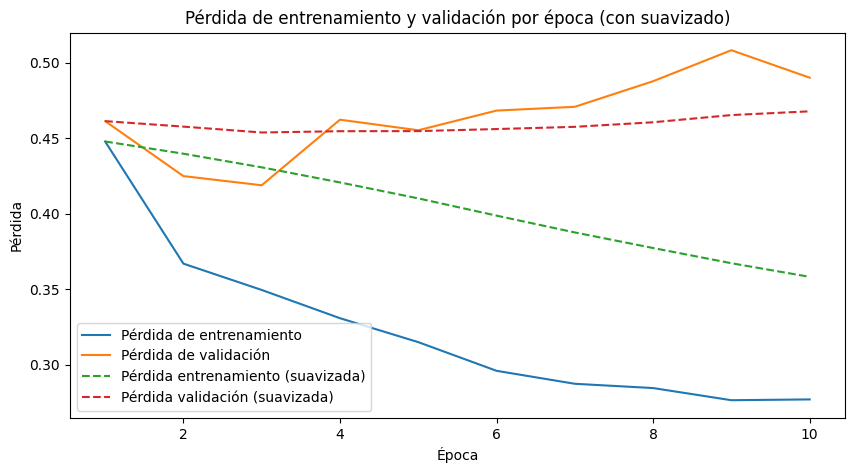

In [17]:
from PIL import Image
from torchvision import transforms

# Definir el dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Usando el dispositivo: {device}')

# Definir la clase Dataset personalizada
class CustomImageDataset(Dataset):
    def __init__(self, data_dir, dataset_type):
        self.data_dir = data_dir
        self.dataset_type = dataset_type
        self.image_files = []
        self.labels = []

        for file_name in os.listdir(data_dir):
            if file_name.startswith(f'X_{dataset_type}_chunk_') and file_name.endswith('.npy'):
                chunk_index = file_name.split('_')[-1].split('.')[0]
                X_path = os.path.join(data_dir, file_name)
                y_path = os.path.join(data_dir, f'y_{dataset_type}_chunk_{chunk_index}.npy')
                if os.path.exists(y_path):
                    self.image_files.append(X_path)
                    self.labels.append(y_path)

        self.samples = []
        for X_file, y_file in zip(self.image_files, self.labels):
            X_chunk = np.load(X_file)
            y_chunk = np.load(y_file)
            num_images, num_patches, C, H, W = X_chunk.shape
            X_chunk = X_chunk.reshape(-1, C, H, W)
            y_chunk = np.repeat(y_chunk, num_patches)
            for img, label in zip(X_chunk, y_chunk):
                self.samples.append((img, label))

        self.le = LabelEncoder()
        labels = [s[1] for s in self.samples]
        self.targets = self.le.fit_transform(labels)

        # Definir las transformaciones
        self.preprocess = EfficientNet_B0_Weights.DEFAULT.transforms()
        self.train_transforms = transforms.Compose([
            transforms.RandomResizedCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.RandomRotation(15),
            self.preprocess,
        ])
        self.val_transforms = self.preprocess

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        image = self.samples[idx][0]
        label = self.targets[idx]
        image = Image.fromarray((image.transpose(1, 2, 0) * 255).astype(np.uint8))

        if self.dataset_type.startswith('train'):
            image = self.train_transforms(image)
        else:
            image = self.val_transforms(image)

        return image, label

# Definir la clase del modelo
class EfficientNetClassifier(nn.Module):
    def __init__(self, num_classes):
        super(EfficientNetClassifier, self).__init__()
        self.model = efficientnet_b0(weights=EfficientNet_B0_Weights.DEFAULT)
        self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, num_classes)

    def forward(self, x):
        return self.model(x)

data_dir = danielvaldez202021_proyect_ds_dataset_path  # Reemplaza con tu ruta

batch_size = 64
num_epochs = 10
learning_rate = 1e-4

train_dataset = CustomImageDataset(data_dir, 'train_fold0')
val_dataset = CustomImageDataset(data_dir, 'val_fold0')

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

num_classes = len(np.unique(train_dataset.targets))
model = EfficientNetClassifier(num_classes)
model = model.to(device)

criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(model.parameters(), lr=learning_rate)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

def moving_average(values, alpha=0.9):
    ema_values = []
    ema = values[0]
    for value in values:
        ema = alpha * ema + (1 - alpha) * value
        ema_values.append(ema)
    return ema_values

def train(model, loader, criterion, optimizer):
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(loader, desc='Entrenando'):
        images = images.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

def evaluate(model, loader, criterion):
    model.eval()
    running_loss = 0.0
    preds = []
    true_labels = []
    with torch.no_grad():
        for images, labels in tqdm(loader, desc='Validando'):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            preds.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss, preds, true_labels

train_losses = []
val_losses = []
best_val_loss = float('inf')
for epoch in range(num_epochs):
    print(f'Epoch {epoch+1}/{num_epochs}')
    train_loss = train(model, train_loader, criterion, optimizer)
    val_loss, val_preds, val_true = evaluate(model, val_loader, criterion)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f'Pérdida de entrenamiento: {train_loss:.4f}')
    print(f'Pérdida de validación: {val_loss:.4f}')

    scheduler.step()

    print('Reporte de clasificación:')
    print(classification_report(val_true, val_preds, target_names=train_dataset.le.classes_))
    print('Matriz de confusión:')
    print(confusion_matrix(val_true, val_preds))

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), 'best_model.pth')
        print('Modelo mejorado y guardado.')

print('Entrenamiento completado.')

train_losses_smoothed = moving_average(train_losses, alpha=0.9)
val_losses_smoothed = moving_average(val_losses, alpha=0.9)

plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), train_losses, label='Pérdida de entrenamiento')
plt.plot(range(1, num_epochs + 1), val_losses, label='Pérdida de validación')
plt.plot(range(1, num_epochs + 1), train_losses_smoothed, label='Pérdida entrenamiento (suavizada)', linestyle='--')
plt.plot(range(1, num_epochs + 1), val_losses_smoothed, label='Pérdida validación (suavizada)', linestyle='--')
plt.xlabel('Época')
plt.ylabel('Pérdida')
plt.title('Pérdida de entrenamiento y validación por época (con suavizado)')
plt.legend()
plt.show()


## Version final del modelo
Combinando las tecnicas utilizadas en los anteriores incisos. Se entrenó el modelo con el uso de los distintos folds que se tiene de la data y se le agregó dopout. Está técnica resultó mucho mejor al momento de entrenar el modelo. Haciendo que luego del tercer fold la pérdida de la validación fuera mucho más consistente y dejara de subir tanto.

> Sin embargo el mayor problema es que reduce un poco su accuracy. Entonces como tal este modelo es el que menor riesgo de sobreajuste tiene y también el de menor accuracy.

Usando el dispositivo: cuda

Fold 1/5
Epoch 1/10


Pérdida de entrenamiento: 0.4347
Pérdida de validación: 0.4815
Epoch 2/10


Pérdida de entrenamiento: 0.3678
Pérdida de validación: 0.4160
Epoch 3/10


Pérdida de entrenamiento: 0.3482
Pérdida de validación: 0.3940
Epoch 4/10


Pérdida de entrenamiento: 0.3295
Pérdida de validación: 0.4519
Epoch 5/10


Pérdida de entrenamiento: 0.3138
Pérdida de validación: 0.5068
Epoch 6/10


Pérdida de entrenamiento: 0.3007
Pérdida de validación: 0.4558
Epoch 7/10


Pérdida de entrenamiento: 0.2835
Pérdida de validación: 0.5107
Epoch 8/10


Pérdida de entrenamiento: 0.2783
Pérdida de validación: 0.4740
Epoch 9/10


Pérdida de entrenamiento: 0.2703
Pérdida de validación: 0.4915
Epoch 10/10


Pérdida de entrenamiento: 0.2679
Pérdida de validación: 0.4711
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.86      0.96      0.91      1650
         LAA       0.83      0.58      0.68       615

    accuracy                           0.85      2265
   macro avg       0.85      0.77      0.79      2265
weighted avg       0.85      0.85      0.84      2265

Matriz de confusión:
[[1579   71]
 [ 260  355]]


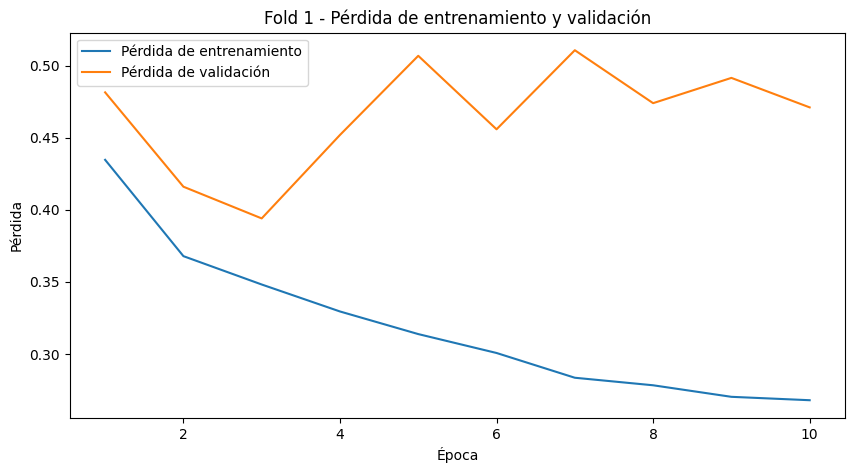


Fold 2/5
Epoch 1/10


Pérdida de entrenamiento: 0.4424
Pérdida de validación: 0.4275
Epoch 2/10


Pérdida de entrenamiento: 0.3660
Pérdida de validación: 0.4308
Epoch 3/10


Pérdida de entrenamiento: 0.3440
Pérdida de validación: 0.4486
Epoch 4/10


Pérdida de entrenamiento: 0.3275
Pérdida de validación: 0.4630
Epoch 5/10


Pérdida de entrenamiento: 0.3174
Pérdida de validación: 0.4828
Epoch 6/10


Pérdida de entrenamiento: 0.3047
Pérdida de validación: 0.5079
Epoch 7/10


Pérdida de entrenamiento: 0.2847
Pérdida de validación: 0.5629
Epoch 8/10


Pérdida de entrenamiento: 0.2823
Pérdida de validación: 0.5306
Epoch 9/10


Pérdida de entrenamiento: 0.2732
Pérdida de validación: 0.5242
Epoch 10/10


Pérdida de entrenamiento: 0.2726
Pérdida de validación: 0.5326
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.86      0.98      0.91      1650
         LAA       0.90      0.56      0.69       615

    accuracy                           0.86      2265
   macro avg       0.88      0.77      0.80      2265
weighted avg       0.87      0.86      0.85      2265

Matriz de confusión:
[[1611   39]
 [ 270  345]]


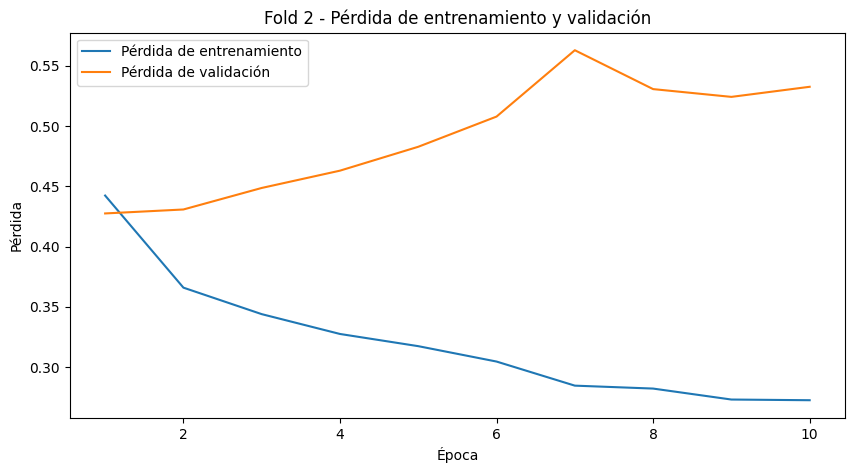


Fold 3/5
Epoch 1/10


Pérdida de entrenamiento: 0.4396
Pérdida de validación: 0.4241
Epoch 2/10


Pérdida de entrenamiento: 0.3730
Pérdida de validación: 0.4387
Epoch 3/10


Pérdida de entrenamiento: 0.3482
Pérdida de validación: 0.4282
Epoch 4/10


Pérdida de entrenamiento: 0.3353
Pérdida de validación: 0.4071
Epoch 5/10


Pérdida de entrenamiento: 0.3180
Pérdida de validación: 0.4145
Epoch 6/10


Pérdida de entrenamiento: 0.3053
Pérdida de validación: 0.4219
Epoch 7/10


Pérdida de entrenamiento: 0.2948
Pérdida de validación: 0.4444
Epoch 8/10


Pérdida de entrenamiento: 0.2833
Pérdida de validación: 0.4559
Epoch 9/10


Pérdida de entrenamiento: 0.2786
Pérdida de validación: 0.4491
Epoch 10/10


Pérdida de entrenamiento: 0.2746
Pérdida de validación: 0.4645
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.83      0.97      0.90      1635
         LAA       0.85      0.50      0.63       630

    accuracy                           0.84      2265
   macro avg       0.84      0.73      0.76      2265
weighted avg       0.84      0.84      0.82      2265

Matriz de confusión:
[[1581   54]
 [ 316  314]]


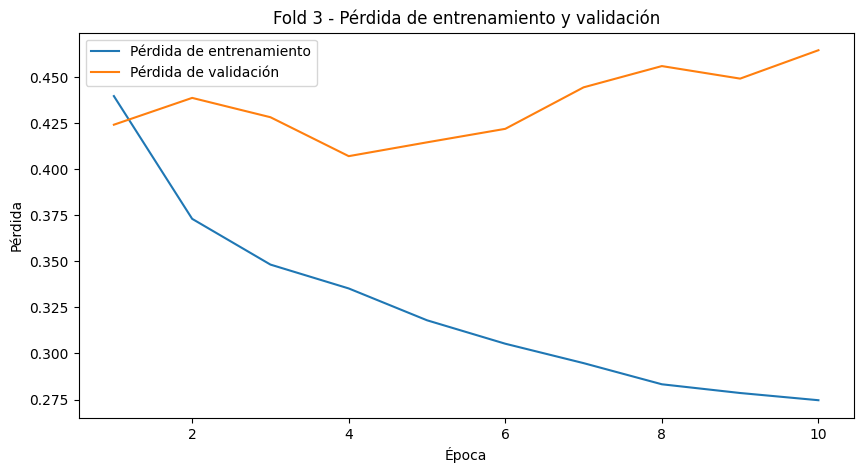


Fold 4/5
Epoch 1/10


Pérdida de entrenamiento: 0.4255
Pérdida de validación: 0.4811
Epoch 2/10


Pérdida de entrenamiento: 0.3623
Pérdida de validación: 0.4190
Epoch 3/10


Pérdida de entrenamiento: 0.3378
Pérdida de validación: 0.4275
Epoch 4/10


Pérdida de entrenamiento: 0.3215
Pérdida de validación: 0.4522
Epoch 5/10


Pérdida de entrenamiento: 0.3016
Pérdida de validación: 0.4434
Epoch 6/10


Pérdida de entrenamiento: 0.2938
Pérdida de validación: 0.4711
Epoch 7/10


Pérdida de entrenamiento: 0.2741
Pérdida de validación: 0.4846
Epoch 8/10


Pérdida de entrenamiento: 0.2686
Pérdida de validación: 0.5180
Epoch 9/10


Pérdida de entrenamiento: 0.2623
Pérdida de validación: 0.5275
Epoch 10/10


Pérdida de entrenamiento: 0.2578
Pérdida de validación: 0.5123
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.83      0.99      0.90      1635
         LAA       0.93      0.48      0.63       630

    accuracy                           0.85      2265
   macro avg       0.88      0.73      0.77      2265
weighted avg       0.86      0.85      0.83      2265

Matriz de confusión:
[[1613   22]
 [ 327  303]]


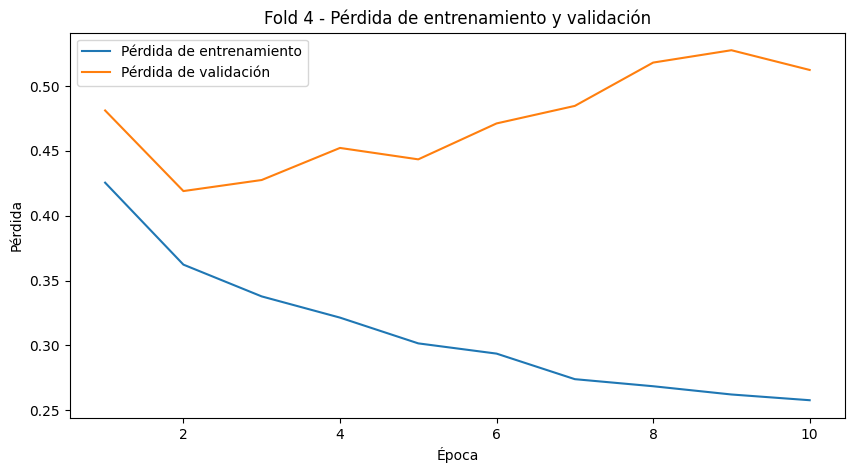


Fold 5/5
Epoch 1/10


Pérdida de entrenamiento: 0.4420
Pérdida de validación: 0.4457
Epoch 2/10


Pérdida de entrenamiento: 0.3748
Pérdida de validación: 0.4320
Epoch 3/10


Pérdida de entrenamiento: 0.3553
Pérdida de validación: 0.4718
Epoch 4/10


Pérdida de entrenamiento: 0.3281
Pérdida de validación: 0.4380
Epoch 5/10


Pérdida de entrenamiento: 0.3151
Pérdida de validación: 0.4996
Epoch 6/10


Pérdida de entrenamiento: 0.3003
Pérdida de validación: 0.4238
Epoch 7/10


Pérdida de entrenamiento: 0.2921
Pérdida de validación: 0.4842
Epoch 8/10


Pérdida de entrenamiento: 0.2796
Pérdida de validación: 0.4683
Epoch 9/10


Pérdida de entrenamiento: 0.2771
Pérdida de validación: 0.4963
Epoch 10/10


Pérdida de entrenamiento: 0.2687
Pérdida de validación: 0.5255
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.84      0.99      0.91      1635
         LAA       0.94      0.50      0.65       615

    accuracy                           0.85      2250
   macro avg       0.89      0.74      0.78      2250
weighted avg       0.87      0.85      0.84      2250

Matriz de confusión:
[[1614   21]
 [ 308  307]]


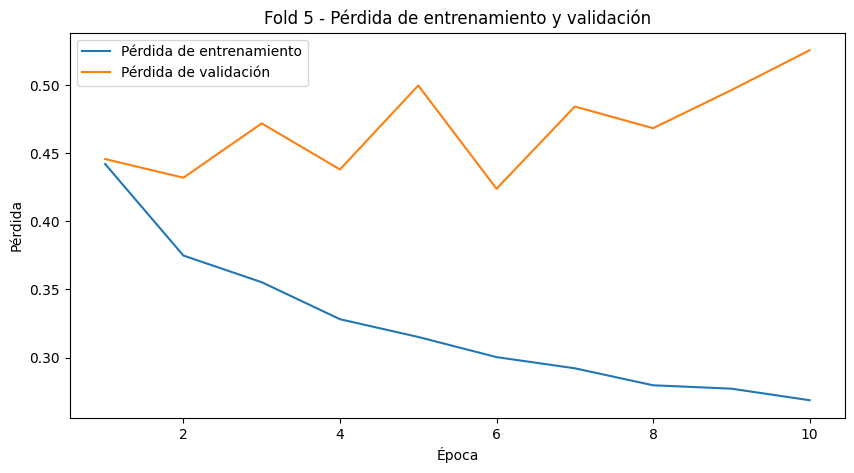


Resultados de los 5 folds:
              precision    recall  f1-score   support

          CE       0.84      0.97      0.90      8205
         LAA       0.89      0.52      0.66      3105

    accuracy                           0.85     11310
   macro avg       0.87      0.75      0.78     11310
weighted avg       0.86      0.85      0.84     11310

Matriz de confusión acumulada:
[[7998  207]
 [1481 1624]]


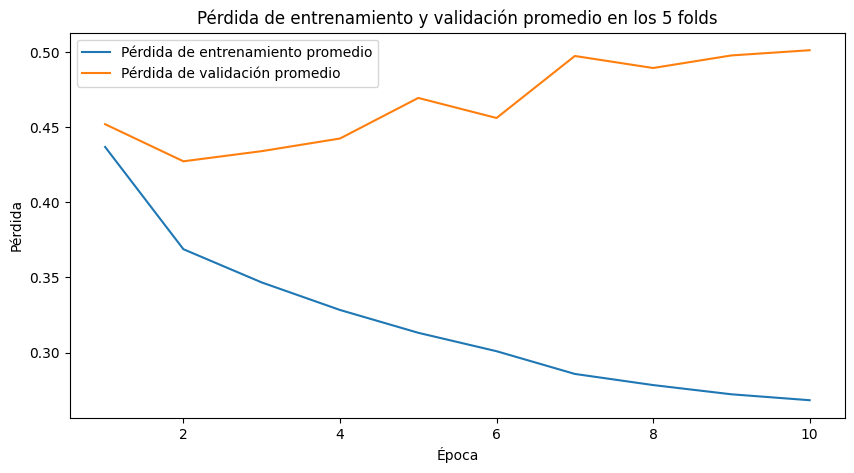

In [18]:
# Definir el dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Usando el dispositivo: {device}')

# Definir la clase Dataset personalizada
class CustomImageDataset(Dataset):
    def __init__(self, data_dir, dataset_type, le=None):
        self.data_dir = data_dir
        self.dataset_type = dataset_type
        self.image_files = []
        self.labels = []

        # Cargar todos los archivos .npy correspondientes al fold
        for file_name in os.listdir(data_dir):
            if file_name.startswith(f'X_{dataset_type}_chunk_') and file_name.endswith('.npy'):
                chunk_index = file_name.split('_')[-1].split('.')[0]
                X_path = os.path.join(data_dir, file_name)
                y_path = os.path.join(data_dir, f'y_{dataset_type}_chunk_{chunk_index}.npy')
                if os.path.exists(y_path):
                    self.image_files.append(X_path)
                    self.labels.append(y_path)

        # Crear una lista de muestras (imágenes y etiquetas)
        self.samples = []
        for X_file, y_file in zip(self.image_files, self.labels):
            X_chunk = np.load(X_file)  # Forma: (num_imágenes, num_patches, C, H, W)
            y_chunk = np.load(y_file)  # Forma: (num_imágenes,)

            num_images, num_patches, C, H, W = X_chunk.shape
            # Aplanar los parches
            X_chunk = X_chunk.reshape(-1, C, H, W)  # Nueva forma: (num_imágenes * num_patches, C, H, W)
            # Repetir las etiquetas para cada parche
            y_chunk = np.repeat(y_chunk, num_patches)

            for img, label in zip(X_chunk, y_chunk):
                self.samples.append((img, label))

        # Codificar las etiquetas
        labels = [s[1] for s in self.samples]
        if le is None:
            self.le = LabelEncoder()
            self.le.fit(labels)
        else:
            self.le = le
        self.targets = self.le.transform(labels)

        # Definir las transformaciones
        self.preprocess = EfficientNet_B0_Weights.DEFAULT.transforms()
        self.train_transforms = transforms.Compose([
            transforms.RandomResizedCrop(224),
            transforms.RandomHorizontalFlip(),
            transforms.RandomRotation(15),
            self.preprocess,
        ])
        self.val_transforms = self.preprocess

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        image = self.samples[idx][0]
        label = self.targets[idx]
        image = Image.fromarray((image.transpose(1, 2, 0) * 255).astype(np.uint8))

        if self.dataset_type.startswith('train'):
            image = self.train_transforms(image)
        else:
            image = self.val_transforms(image)

        return image, label

# Definir la clase del modelo
class EfficientNetClassifier(nn.Module):
    def __init__(self, num_classes):
        super(EfficientNetClassifier, self).__init__()
        self.model = efficientnet_b0(weights=EfficientNet_B0_Weights.DEFAULT)
        self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, num_classes)

    def forward(self, x):
        return self.model(x)

# Ruta a los datos
data_dir = danielvaldez202021_proyect_ds_dataset_path  # Reemplaza con la ruta real a tus datos

# Parámetros
batch_size = 32
num_epochs = 10
learning_rate = 1e-4
num_folds = 5

# Inicializar listas para guardar las predicciones y etiquetas verdaderas
all_val_true = []
all_val_preds = []

# Almacenar las pérdidas por fold
fold_train_losses = []
fold_val_losses = []

# Ajustar LabelEncoder en todas las etiquetas disponibles
all_labels = []
for fold in range(num_folds):
    dataset_type = f'train_fold{fold}'
    labels_files = []

    for file_name in os.listdir(data_dir):
        if file_name.startswith(f'y_{dataset_type}_chunk_') and file_name.endswith('.npy'):
            y_path = os.path.join(data_dir, file_name)
            labels_files.append(y_path)

    for y_file in labels_files:
        y_chunk = np.load(y_file)
        all_labels.extend(y_chunk)

le = LabelEncoder()
le.fit(all_labels)

# Funciones de entrenamiento y evaluación
def train(model, loader, criterion, optimizer):
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(loader, desc='Entrenando', leave=False):
        images = images.to(device)
        labels = labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

def evaluate(model, loader, criterion):
    model.eval()
    running_loss = 0.0
    preds = []
    true_labels = []
    with torch.no_grad():
        for images, labels in tqdm(loader, desc='Validando', leave=False):
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            preds.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss, preds, true_labels

# Validación cruzada
for fold in range(num_folds):
    print(f'\nFold {fold+1}/{num_folds}')

    # Crear datasets para el fold actual
    train_dataset = CustomImageDataset(data_dir, f'train_fold{fold}', le=le)
    val_dataset = CustomImageDataset(data_dir, f'val_fold{fold}', le=le)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    # Inicializar el modelo, pérdida y optimizador
    num_classes = len(le.classes_)
    model = EfficientNetClassifier(num_classes).to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.AdamW(model.parameters(), lr=learning_rate)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    # Listas para almacenar pérdidas por época
    train_losses = []
    val_losses = []

    # Entrenamiento para el fold actual
    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        train_loss = train(model, train_loader, criterion, optimizer)
        val_loss, val_preds, val_true = evaluate(model, val_loader, criterion)

        train_losses.append(train_loss)
        val_losses.append(val_loss)

        print(f'Pérdida de entrenamiento: {train_loss:.4f}')
        print(f'Pérdida de validación: {val_loss:.4f}')

        scheduler.step()

    # Guardar las pérdidas del fold actual
    fold_train_losses.append(train_losses)
    fold_val_losses.append(val_losses)

    # Métricas del fold
    print('Reporte de clasificación:')
    print(classification_report(val_true, val_preds, target_names=le.classes_))
    print('Matriz de confusión:')
    print(confusion_matrix(val_true, val_preds))

    # Guardar predicciones y etiquetas verdaderas para métricas de validación
    all_val_true.extend(val_true)
    all_val_preds.extend(val_preds)

    # Graficar las pérdidas para el fold actual
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs + 1), train_losses, label='Pérdida de entrenamiento')
    plt.plot(range(1, num_epochs + 1), val_losses, label='Pérdida de validación')
    plt.xlabel('Época')
    plt.ylabel('Pérdida')
    plt.title(f'Fold {fold+1} - Pérdida de entrenamiento y validación')
    plt.legend()
    plt.show()

# Métricas generales de los 5 folds
print("\nResultados de los 5 folds:")
print(classification_report(all_val_true, all_val_preds, target_names=le.classes_))
print("Matriz de confusión acumulada:")
print(confusion_matrix(all_val_true, all_val_preds))

# Calcular pérdidas promedio por época en todos los folds
avg_train_losses = np.mean(fold_train_losses, axis=0)
avg_val_losses = np.mean(fold_val_losses, axis=0)

# Graficar las pérdidas promedio
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), avg_train_losses, label='Pérdida de entrenamiento promedio')
plt.plot(range(1, num_epochs + 1), avg_val_losses, label='Pérdida de validación promedio')
plt.xlabel('Época')
plt.ylabel('Pérdida')
plt.title('Pérdida de entrenamiento y validación promedio en los 5 folds')
plt.legend()
plt.show()
